In [1269]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import librosa
from utils.utils import save_data
import numpy as np
from scipy.signal import butter, lfilter
from noisereduce import reduce_noise
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from matplotlib import cm
from datetime import datetime
import librosa.display
import IPython.display as ipd
from io import BytesIO

In [1270]:
label_dir = '../../recordings_with_tones.csv'
audio_dir = '../../recordings'
data_dir = "data" #saving folder

In [1271]:
selected_word_columns_with_embedding = {
    'a100p': 0,
    # 'a1p': 1,  
    # 'a2p': 2,
    # 'a3p': 3,
    # 'a4p': 4,
    # 'a5p': 5,
    # 'a6p': 6,
    # 'a7p': 7,
    # 'a8p': 8,
    # 'a9p': 9,
    # 'a10p': 10,
    # 'a100p': 11
}

### Załadowanie Danych

In [1272]:
label_data = pd.read_csv(label_dir)

In [1273]:
data_rows = []

In [1274]:
for index, row in label_data.iterrows():
    file_id = row['id']
    for key,val in selected_word_columns_with_embedding.items():
        if pd.notnull(row[key]):
            file_path = f'{audio_dir}/stageI/{file_id}/{key[:-1]}.wav'
            if os.path.exists(file_path):
                data_rows.append({
                    'path': file_path,
                    'embedding': val,
                    'label': int(row[key])
                })
df = pd.DataFrame(data_rows)

In [1275]:
df.head()

,path,embedding,label
0,../../recordings/stageI/8/a100.wav,0,0
1,../../recordings/stageI/9/a100.wav,0,1
2,../../recordings/stageI/10/a100.wav,0,1
3,../../recordings/stageI/11/a100.wav,0,0
4,../../recordings/stageI/21/a100.wav,0,0


In [1276]:
df['audio'] = df['path'].apply(lambda x: librosa.load(x, sr=None))

In [1277]:
df.head()

,path,embedding,label,audio
0,../../recordings/stageI/8/a100.wav,0,0,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,../../recordings/stageI/9/a100.wav,0,1,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,../../recordings/stageI/10/a100.wav,0,1,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,../../recordings/stageI/11/a100.wav,0,0,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,../../recordings/stageI/21/a100.wav,0,0,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [1278]:
print("\nLiczba nagrań:", len(df))


Liczba nagrań: 505


### Zdefiniowanie spektrogramów

In [1279]:

def generate_mel_spectrogram(audio, sr, n_mels=128):
    S = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=n_mels, fmax=8000)
    S_dB = librosa.power_to_db(S, ref=np.max)
    return S_dB

In [1280]:
def display_mel_spectrogram_for_audio(audio, sr):
    S_dB = generate_mel_spectrogram(audio,sr)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', fmax=8000)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Mel Spectrogram")
    plt.tight_layout()
    plt.show()

In [1281]:
def display_mel_spectrogram(df: pd.DataFrame):
    for i, row in df.iterrows():
        audio, sr = row['audio']
        S_dB = row['mel_spectrogram']
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', fmax=8000)
        plt.colorbar(format='%+2.0f dB')
        plt.title(f"Mel Spectrogram for {row['path']} with label {row['label']}")
        plt.tight_layout()
        plt.show()

In [1282]:
def display_listenable_audio(df: pd.DataFrame, additional_audio_cols=[]):
    for i, row in df.iterrows():
        audio, sr = row['audio']
        print(f"Playing {row['path']} with label {row['label']}")
        ipd.display(ipd.Audio(data=audio, rate=sr))
        display_mel_spectrogram_for_audio(audio,sr)
        for col in additional_audio_cols:
            audiox, srx = row[col]
            print(col)
            ipd.display(ipd.Audio(data=audiox, rate=srx))
            display_mel_spectrogram_for_audio(audiox, srx)

In [1283]:
#df['mel_spectrogram'] = df['audio'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))

Playing ../../recordings/stageI/8/a100.wav with label 0


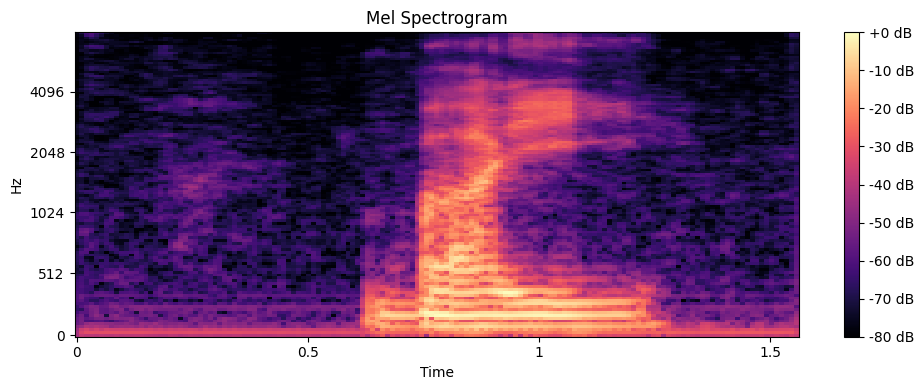

In [1284]:
display_listenable_audio(df.head(1))

### Analiza pojedyńczego słowa (selected_embedding)

Poprawne nagrania dla embedding==0
Playing ../../recordings/stageI/399/a100.wav with label 1


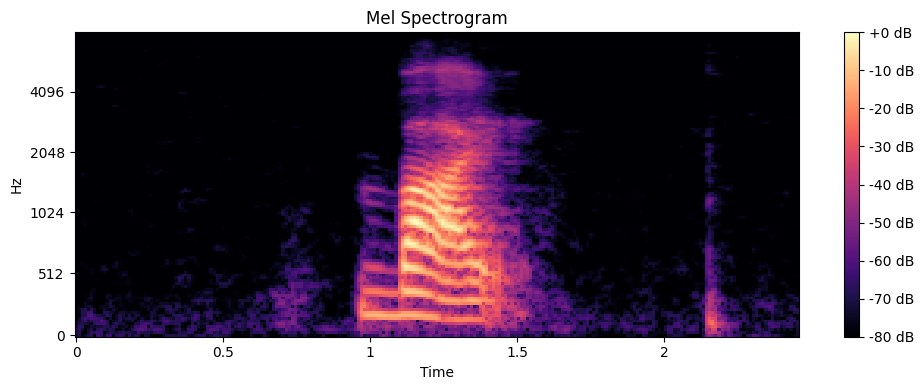

Playing ../../recordings/stageI/1369/a100.wav with label 1


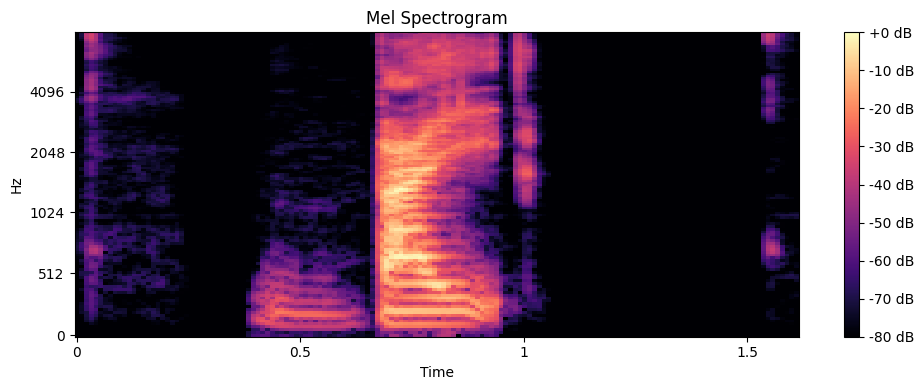

Playing ../../recordings/stageI/499/a100.wav with label 1


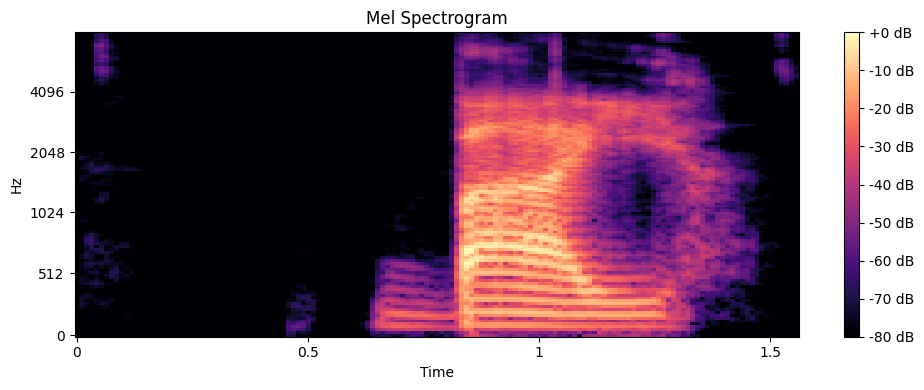

Niepoprawne nagrania dla embedding==0
Playing ../../recordings/stageI/1059/a100.wav with label 0


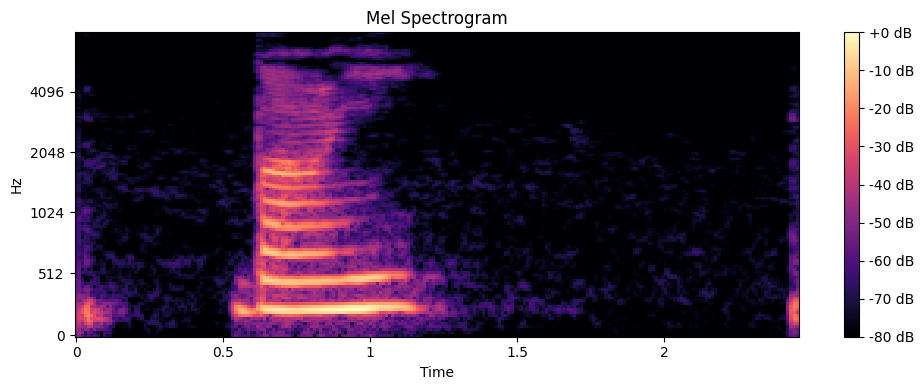

Playing ../../recordings/stageI/739/a100.wav with label 0


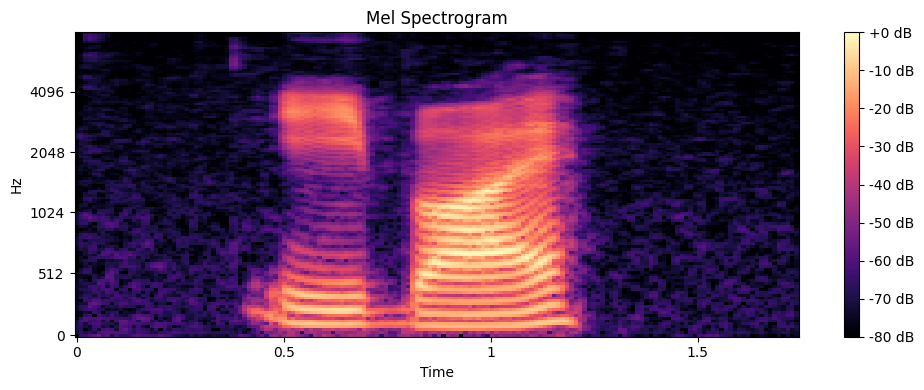

Playing ../../recordings/stageI/138/a100.wav with label 0


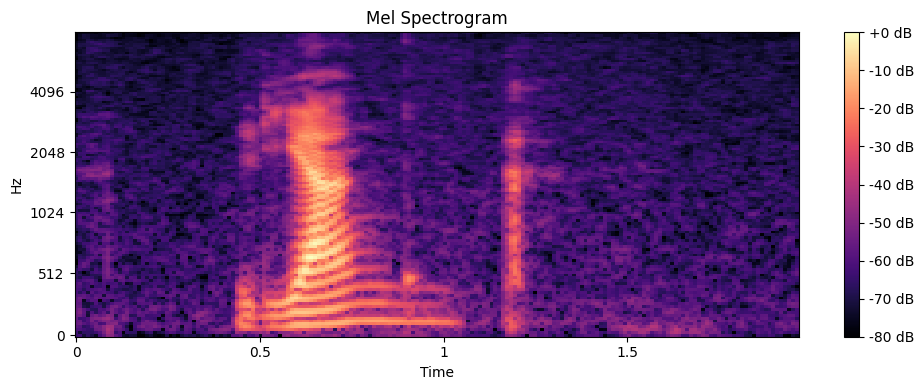

In [1285]:
selected_embedding = 0

filtered_df = df[df['embedding'] == selected_embedding]
label_1_df = filtered_df[filtered_df['label'] == 1]
label_0_df = filtered_df[filtered_df['label'] == 0]
print(f"Poprawne nagrania dla embedding=={selected_embedding}")
display_listenable_audio(label_1_df.sample(n=min(3, len(label_1_df)), random_state=None))
print(f"Niepoprawne nagrania dla embedding=={selected_embedding}")
display_listenable_audio(label_0_df.sample(n=min(3, len(label_0_df)), random_state=None))


### Usunięcie nagrań z dużym szumem

In [1286]:
noise_threshold = 0.004

In [1287]:
df['rms'] = df['audio'].apply(lambda x: np.sqrt(np.mean(np.square(x[0]))))


Liczba nagrań z za dużym szumem: 12
Playing ../../recordings/stageI/664/a100.wav with label 0


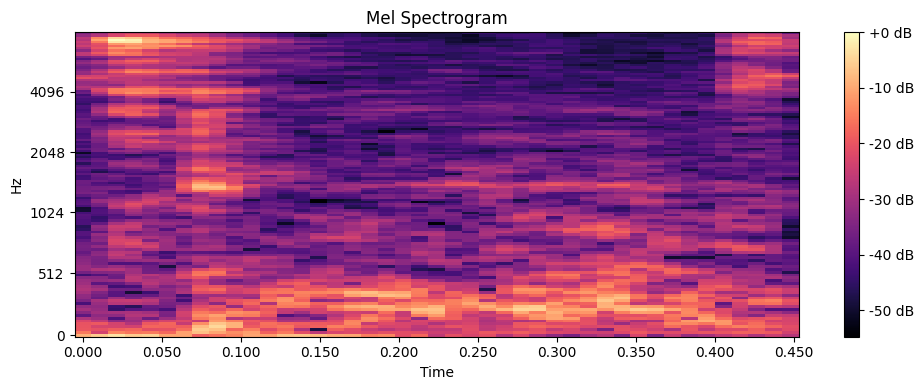

Playing ../../recordings/stageI/587/a100.wav with label 0


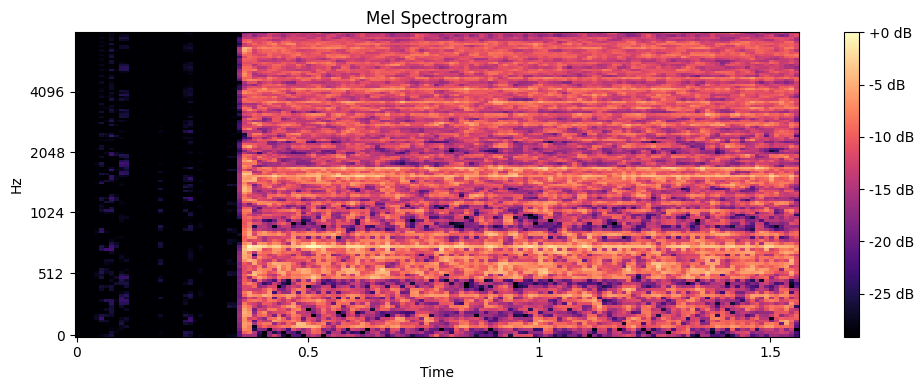

Playing ../../recordings/stageI/592/a100.wav with label 0


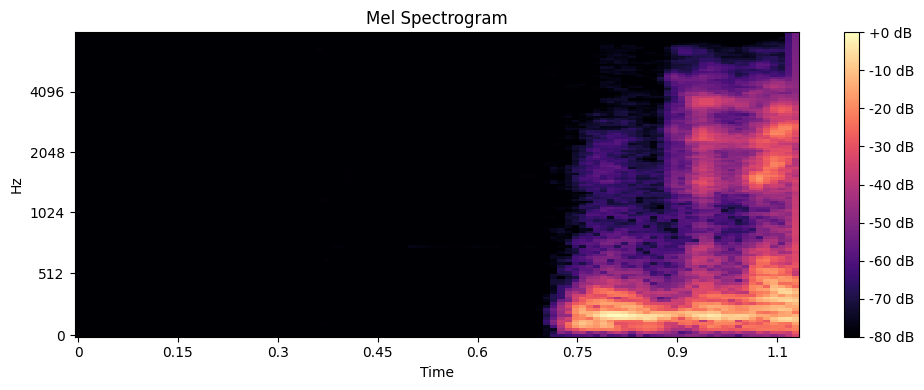

In [1288]:
noisy_df = df[df['rms'] < noise_threshold]
print("\nLiczba nagrań z za dużym szumem:", len(noisy_df))
display_listenable_audio(noisy_df.sample(n=min(3, len(noisy_df)), random_state=None))


In [1289]:
df = df[df['rms'] >= noise_threshold]
print("\nLiczba nagrań po usunięciu:", len(df))


Liczba nagrań po usunięciu: 493


### Usunięcie krótkich nagrań

In [1290]:
duration_seconds_threshold = 0.5

In [1291]:
df['duration'] = df['audio'].apply(lambda x: librosa.get_duration(y=x[0], sr=x[1]))

In [1292]:
short_df = df[df['duration'] < duration_seconds_threshold]
print("\nLiczba nagrań z za krótkim czasem trwania:", len(short_df))
display_listenable_audio(short_df.sample(n=min(3, len(short_df)) , random_state=None))


Liczba nagrań z za krótkim czasem trwania: 0


In [1293]:
df = df[df['duration'] > duration_seconds_threshold]
print("\nLiczba nagrań po usunięciu:", len(df))


Liczba nagrań po usunięciu: 493


### Usunięcie ciszy z nagrań

In [1294]:
top_db = 30

In [1295]:
def remove_silence(audio, sr, top_db=30):
    trimmed_audio, _ = librosa.effects.trim(audio, top_db=top_db)
    return trimmed_audio
df['trimmed_audio'] = df['audio'].apply(lambda x: (remove_silence(x[0], x[1]), x[1]))

Playing ../../recordings/stageI/435/a100.wav with label 1


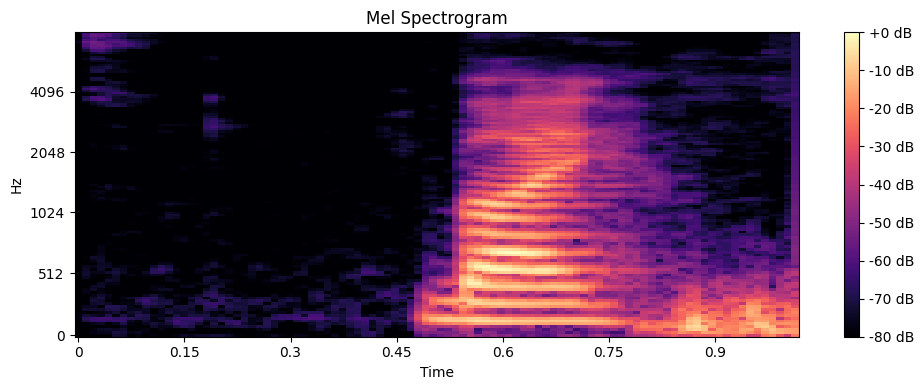

trimmed_audio


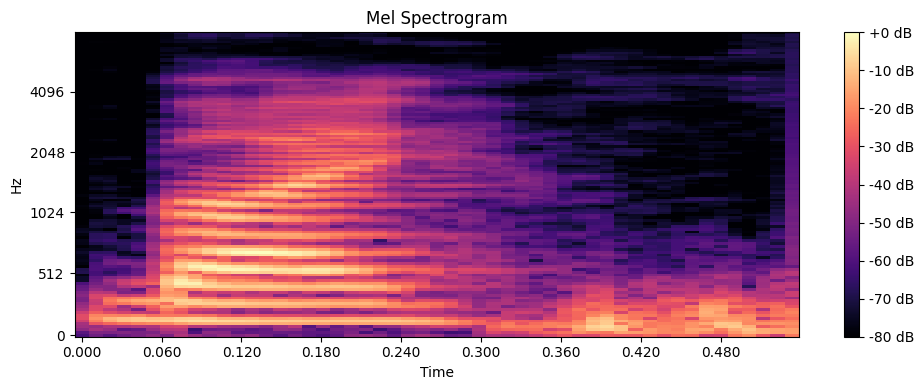

Playing ../../recordings/stageI/355/a100.wav with label 1


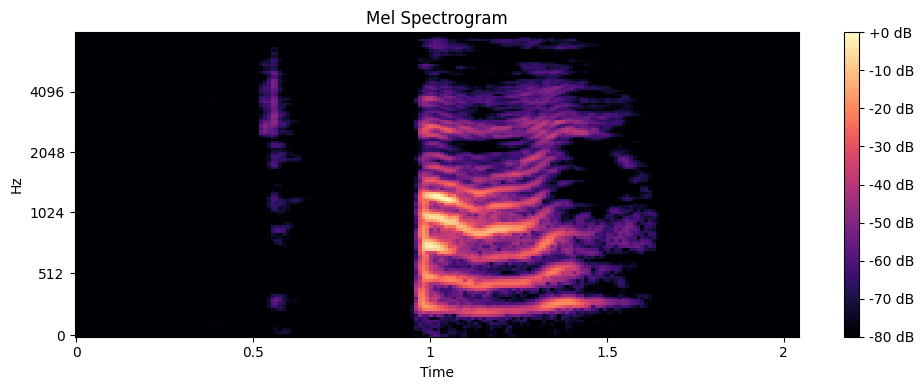

trimmed_audio


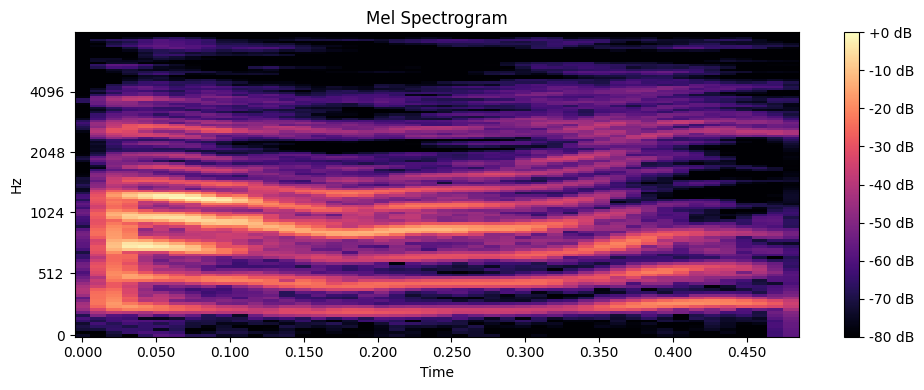

Playing ../../recordings/stageI/406/a100.wav with label 0


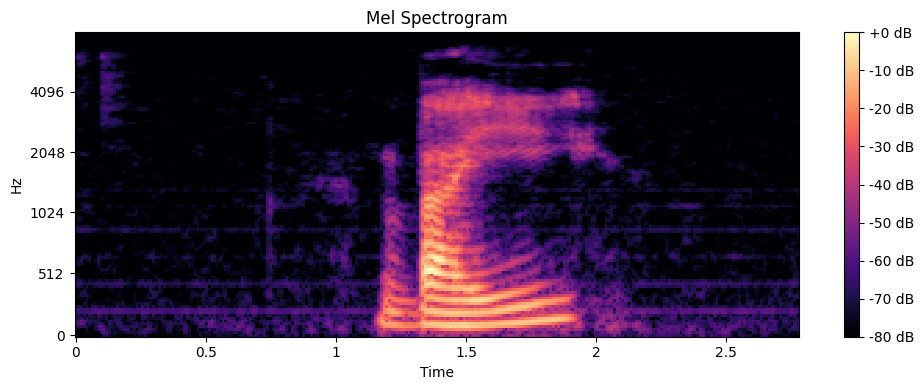

trimmed_audio


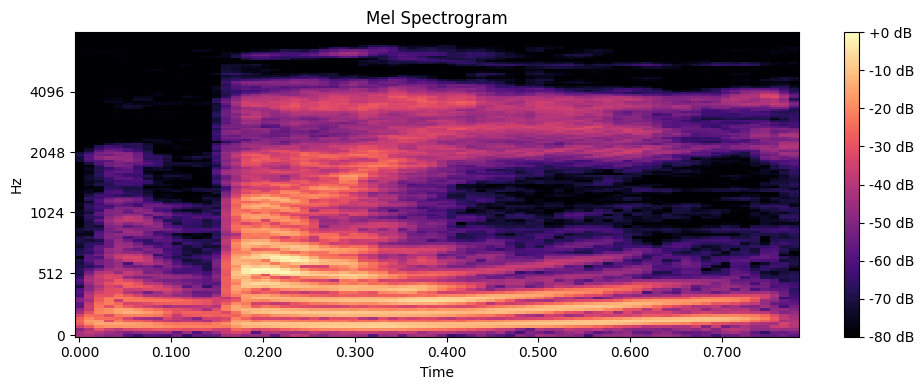

In [1296]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['trimmed_audio'])

In [1297]:
df['audio'] = df['trimmed_audio']
df = df.drop(columns=['trimmed_audio'])

### Redukcja szumu

In [1298]:
noise_profile = 0.5 
lowcut = 80
highcut = 8000

1. Redukcja szumu za pomocą profilowania szumu z początku nagrania

In [1299]:


def reduce_noise_in_audio(audio, sr):
    noise_part = audio[:int(noise_profile * sr)]
    return reduce_noise(y=audio, sr=sr, y_noise=noise_part)

df['reduced_audio'] = df['audio'].apply(lambda x: (reduce_noise_in_audio(x[0], x[1]), x[1]))

2. Filtry pasmowe

In [1300]:
def butter_bandpass_filter(audio, sr):
    nyquist = 0.5 * sr
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(1, [low, high], btype='band')
    return lfilter(b, a, audio)

df['reduced_audio2'] = df['reduced_audio'].apply(lambda x: (butter_bandpass_filter(x[0], x[1]), x[1]))

3. Redukcja szumu spektrogramu

In [1301]:
def spectral_noise_reduction(audio, sr):
    # Tworzenie spektrogramu
    stft = librosa.stft(audio)
    magnitude, phase = librosa.magphase(stft)

    # Średnia amplituda jako próg
    noise_threshold = np.mean(magnitude) * 0.5
    reduced_magnitude = np.where(magnitude > noise_threshold, magnitude, 0)

    # Odwrotna transformacja
    return librosa.istft(reduced_magnitude * phase)

df['reduced_audio3'] = df['reduced_audio2'].apply(lambda x: (spectral_noise_reduction(x[0], x[1]), x[1]))

4. Normalizacja poziomu głośności

In [1302]:
def normalize_audio(audio):
    return librosa.util.normalize(audio)

df['reduced_audio4'] = df['reduced_audio3'].apply(lambda x: (normalize_audio(x[0]), x[1]))

Playing ../../recordings/stageI/533/a100.wav with label 1


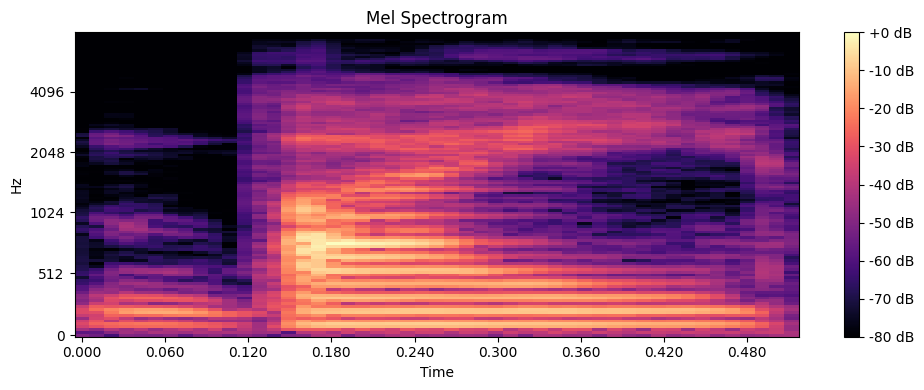

reduced_audio


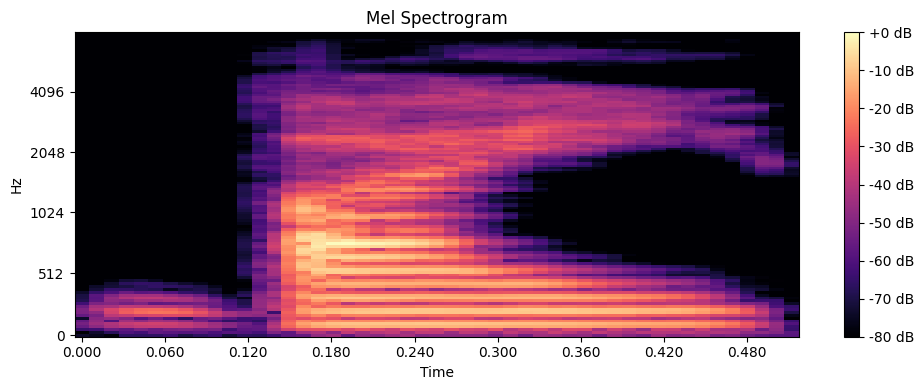

reduced_audio2


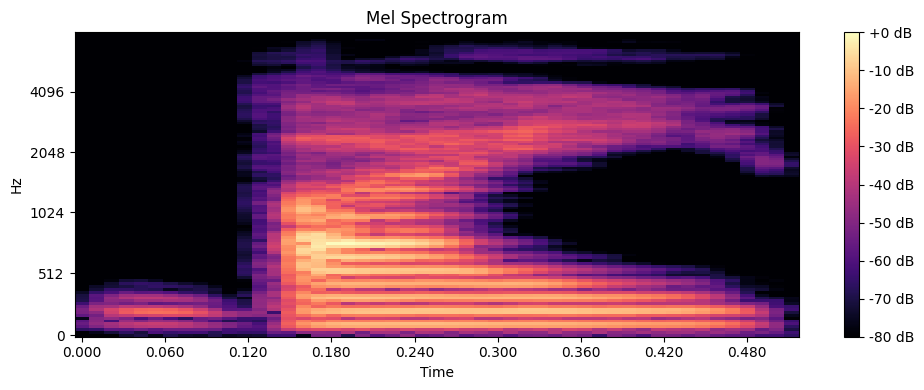

reduced_audio3


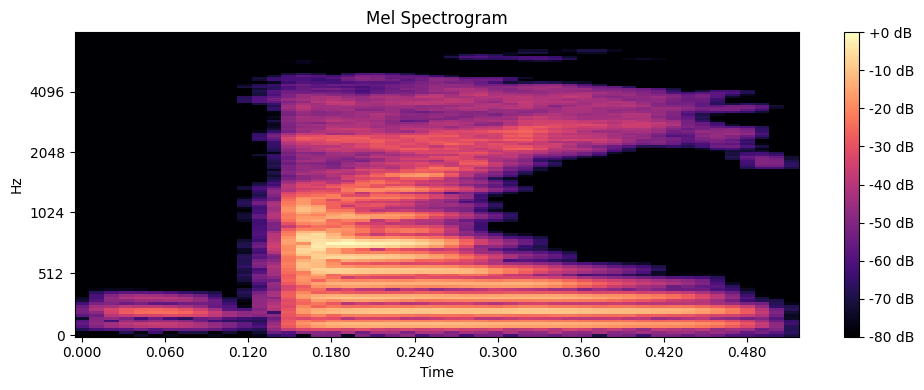

reduced_audio4


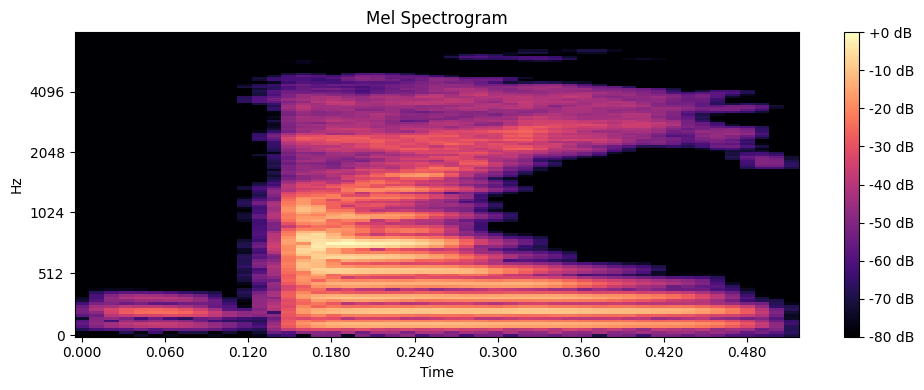

Playing ../../recordings/stageI/339/a100.wav with label 1


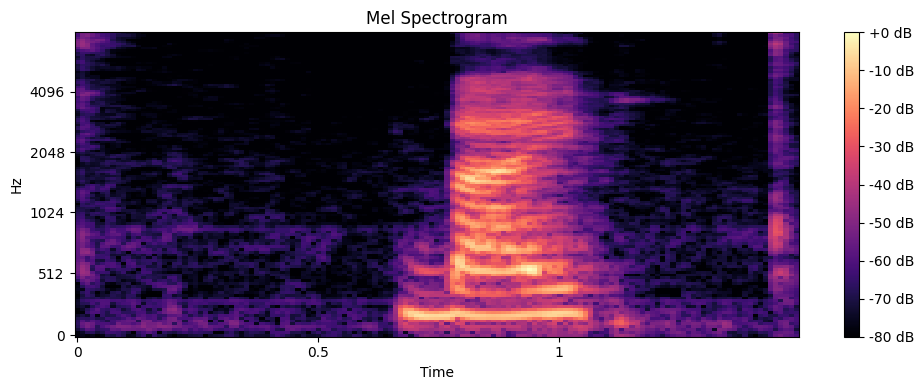

reduced_audio


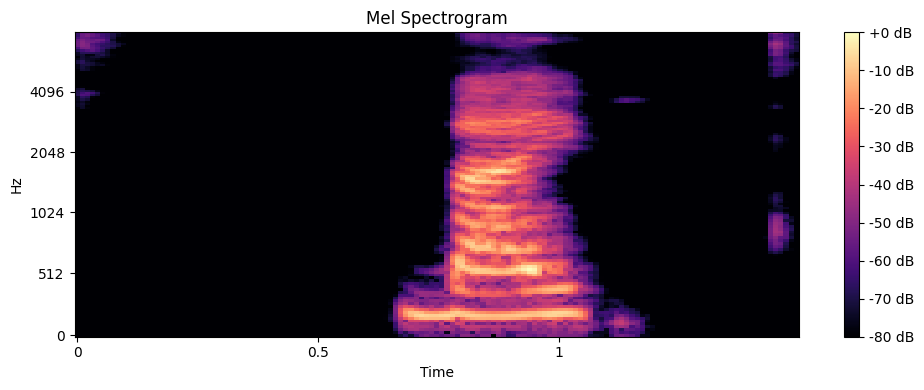

reduced_audio2


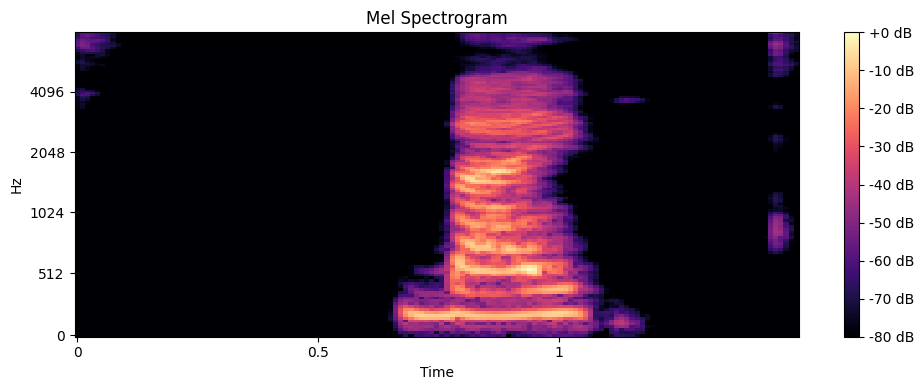

reduced_audio3


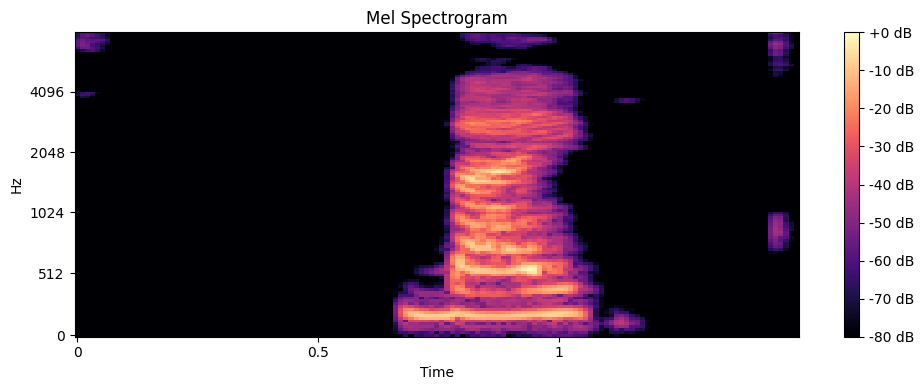

reduced_audio4


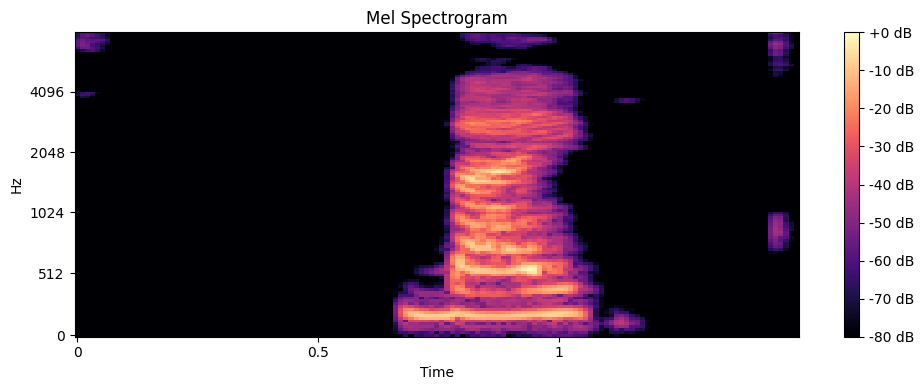

Playing ../../recordings/stageI/436/a100.wav with label 1


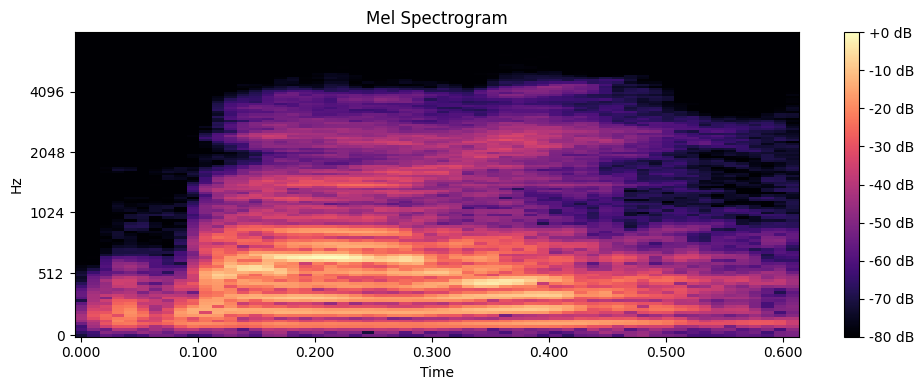

reduced_audio


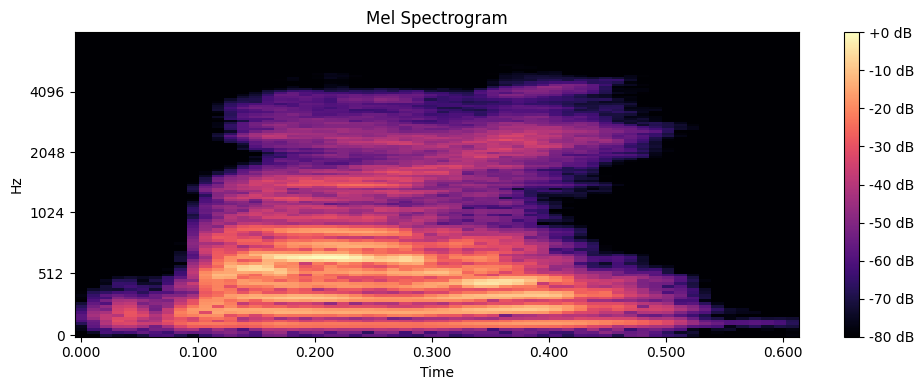

reduced_audio2


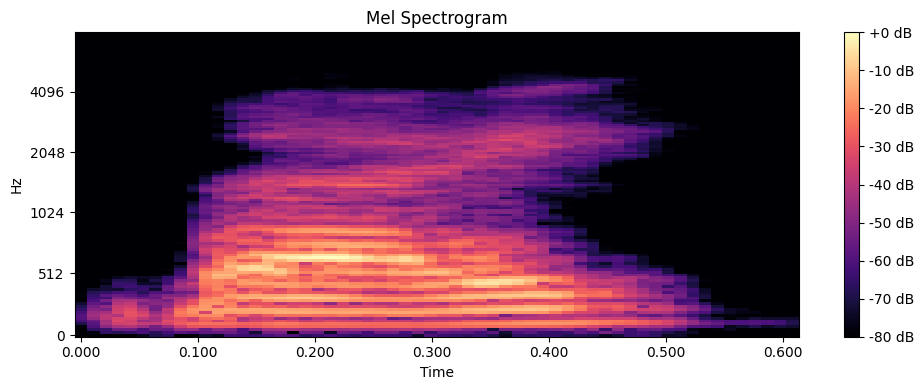

reduced_audio3


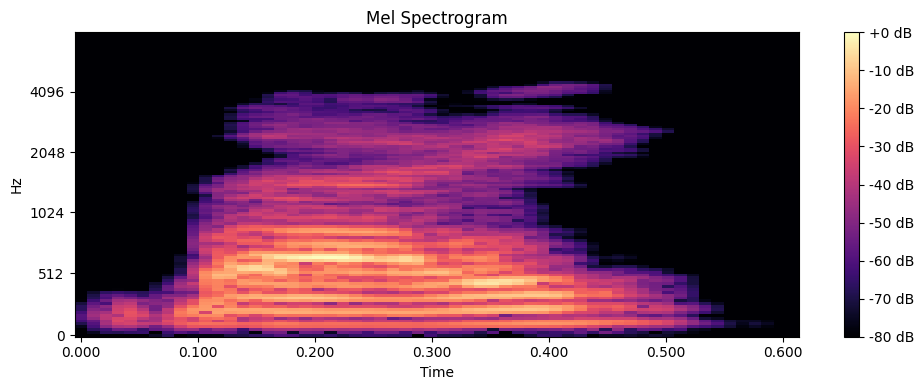

reduced_audio4


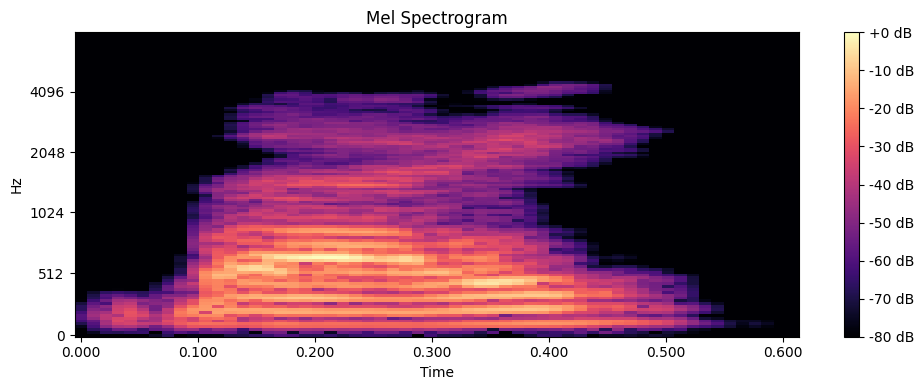

In [1303]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['reduced_audio', 'reduced_audio2', 'reduced_audio3', 'reduced_audio4'])

In [1304]:
df['audio'] = df['reduced_audio4']
df = df.drop(columns=['reduced_audio', 'reduced_audio2', 'reduced_audio3', 'reduced_audio4'])

### Standaryzacja pasma częstotliwości

In [1305]:
target_sr = 16000

In [1306]:
def resample_audio(audio, sr):
    if sr != target_sr:
        audio = librosa.resample(audio, orig_sr=sr, target_sr=target_sr)
    return audio, target_sr

df['resampled_audio'] = df['audio'].apply(lambda x: resample_audio(x[0], x[1]))

In [1307]:
print("Stare częstotliwości próbkowania:", df['audio'].apply(lambda x: x[1]).unique())
print("Nowe częstotliwości próbkowania:", df['resampled_audio'].apply(lambda x: x[1]).unique())

Stare częstotliwości próbkowania: [48000]
Nowe częstotliwości próbkowania: [16000]


Playing ../../recordings/stageI/1085/a100.wav with label 1


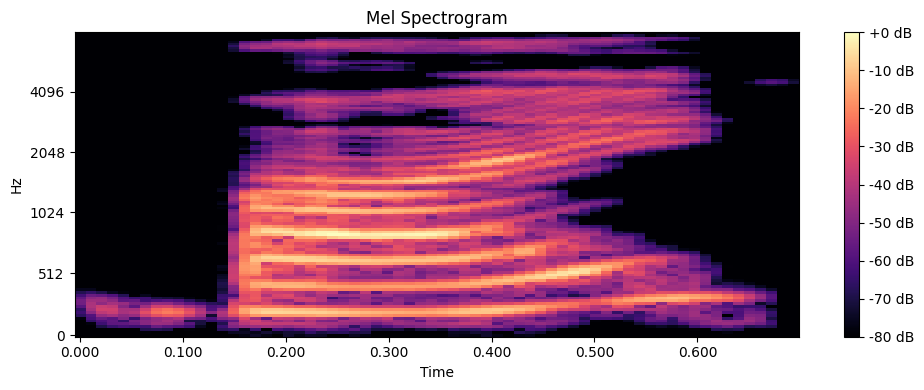

resampled_audio


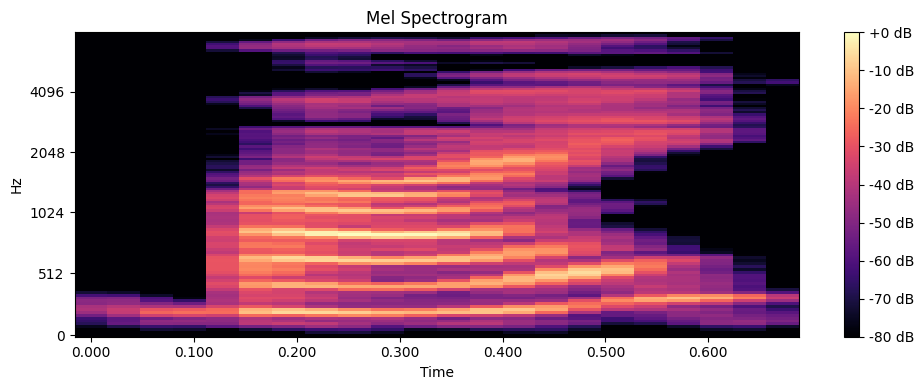

Playing ../../recordings/stageI/1531/a100.wav with label 1


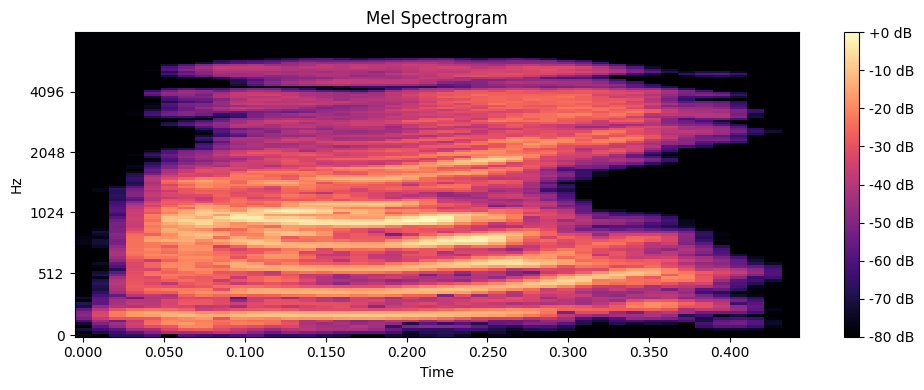

resampled_audio


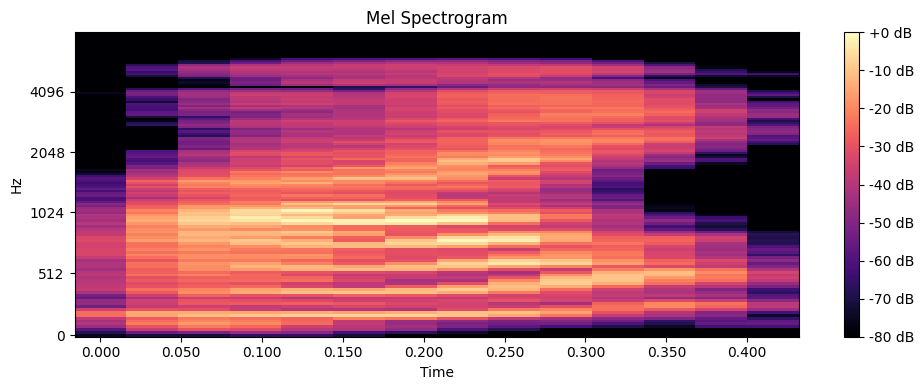

Playing ../../recordings/stageI/1050/a100.wav with label 1


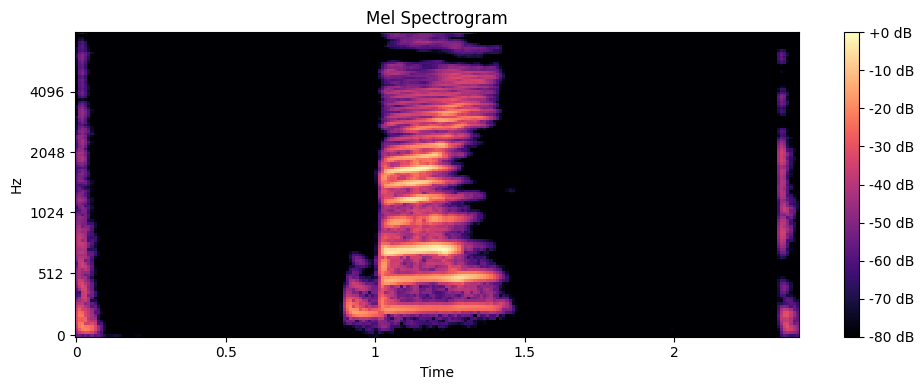

resampled_audio


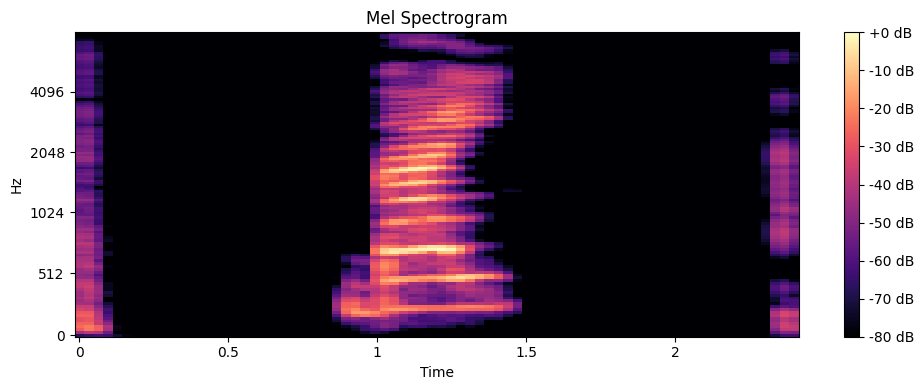

In [1308]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['resampled_audio'])

In [1309]:
df['audio'] = df['resampled_audio']
df = df.drop(columns=['resampled_audio'])

### Usunięcie ekstremalnie długich nagrań

In [1310]:
df['length_samples'] = df['audio'].apply(lambda x: len(x[0]))

In [1311]:
df_sorted = df.sort_values(by='length_samples', ascending=False)
top_5_longest = df_sorted.head(5)
print("5 najdłuższych nagrań (liczba próbek):")
for idx, row in top_5_longest.iterrows():
    print(f"{idx}: {row['length_samples']} próbek")
average_length = df['length_samples'].mean()
print(f"Średnia długość wszystkich próbek wynosi {average_length:.2f} próbek.")
print(f"Liczba elementów {len(df)} elementów przed usunięciem ekstremalnie długich próbek.")

5 najdłuższych nagrań (liczba próbek):
435: 49152 próbek
250: 46422 próbek
282: 45056 próbek
300: 41984 próbek
314: 40619 próbek
Średnia długość wszystkich próbek wynosi 15103.83 próbek.
Liczba elementów 493 elementów przed usunięciem ekstremalnie długich próbek.


In [1312]:
threshold = df['length_samples'].quantile(0.95)
print(f"threshold: {threshold}")
df_filtered = df[df['length_samples'] <= threshold]

threshold: 33451.0


In [1313]:
df_sorted = df_filtered.sort_values(by='length_samples', ascending=False)
top_5_longest = df_sorted.head(5)
print("5 najdłuższych nagrań (liczba próbek):")
for idx, row in top_5_longest.iterrows():
    print(f"{idx}: {row['length_samples']} próbek")
average_length = df['length_samples'].mean()
print(f"Średnia długość wszystkich próbek wynosi {average_length:.2f} próbek.")

5 najdłuższych nagrań (liczba próbek):
342: 33451 próbek
399: 33451 próbek
151: 33451 próbek
331: 33451 próbek
352: 33280 próbek
Średnia długość wszystkich próbek wynosi 15103.83 próbek.


In [1314]:
print(f"Pozostało {len(df)} elementów przed usunięciem ekstremalnie długich próbek.")
df = df_filtered
print(f"Pozostało {len(df)} elementów po usunięciu ekstremalnie długich próbek.")

Pozostało 493 elementów przed usunięciem ekstremalnie długich próbek.
Pozostało 471 elementów po usunięciu ekstremalnie długich próbek.


### Wyrównanie długości nagrań do najdłuższego

In [1315]:
def pad_to_max_length(audio, max_length):
    if len(audio) < max_length:
        return np.pad(audio, (0, max_length - len(audio)), mode='constant')
    elif len(audio) > max_length:
        return audio[:max_length]
    return audio
max_length = df['length_samples'].max()
df['pad_audio'] = df['audio'].apply(lambda x: (pad_to_max_length(x[0], max_length), x[1]))

In [1316]:
print("Stare długości nagrań:", df['audio'].apply(lambda x: len(x[0])).unique())
print("Nowe długości nagrań:", df['pad_audio'].apply(lambda x: len(x[0])).unique())

Stare długości nagrań: [11094 30720  9728 11776  8022  9387  7510 10070 19968  9558 29867  9216
 14848 19115 16726 23211  6486 19798 25942  8192  6827  8875 22870 17408
 10411 23723 20992 12630 19456 26454 18262 11435  6315  9046 10240  5974
  4950 11264 15360 16896 29526 12288 13312  5120 19627 11606 23894  6144
 17750 24747 17920 29355 15702  7680  5632  3584 10752 30038 14678 31062
 21846  8704 16043 16214 17067 29696  7851 30550 12459 14507 12800 13483
 26112  7339 22358 26966 16384  8534 10582 18091 16555  8363  5803 33451
 33280 15190  5291 27136 12971 15872 24235 18603 25259 26624 26795 13995
 22528  7168 13142 22699 23552 12118 22016 23382 10923  6998 17579 15019
 20822 32256 26283 15531 20139 17238 25430 28331 24406 18774 33110 21504
 14166  3926 27819 28672  9899 19286 21163 32598  4608 24576 20310  6656
 11947 18944  5462 29184 27478 30379  3755 21334 25088  4096 28843 27990
  2731  4779 14336 27648 13824 31574]
Nowe długości nagrań: [33451]


Playing ../../recordings/stageI/685/a100.wav with label 1


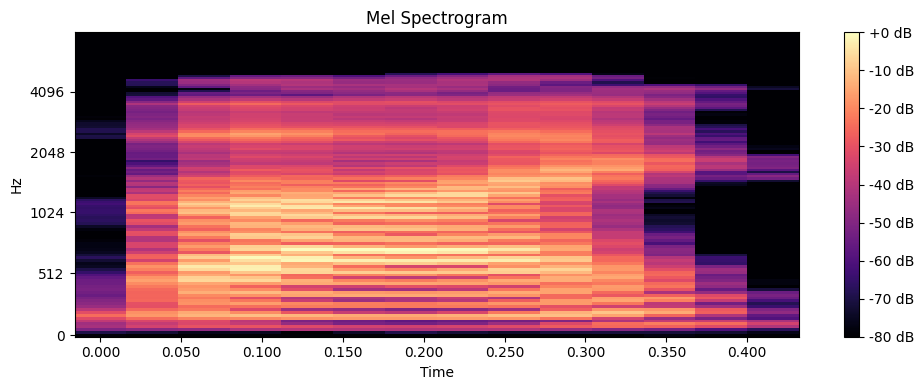

pad_audio


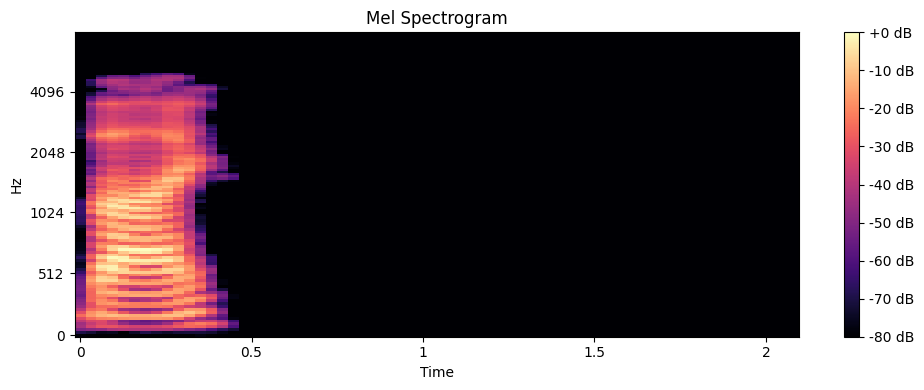

Playing ../../recordings/stageI/25/a100.wav with label 0


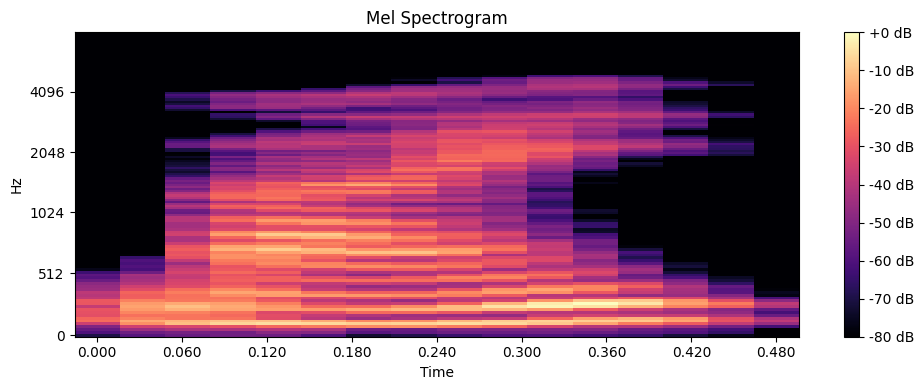

pad_audio


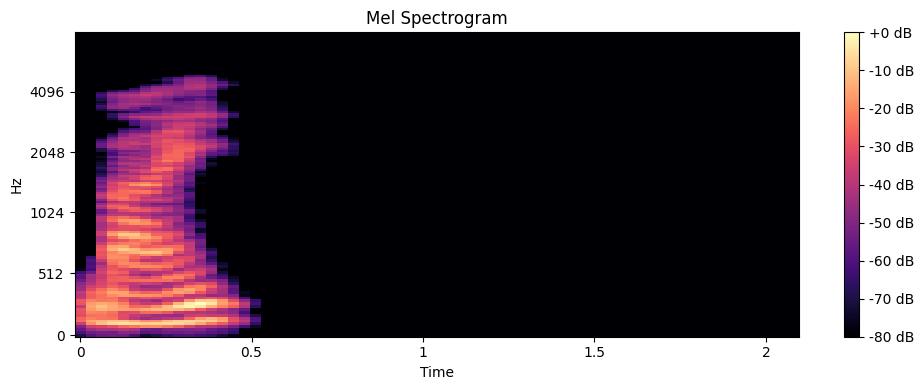

Playing ../../recordings/stageI/946/a100.wav with label 1


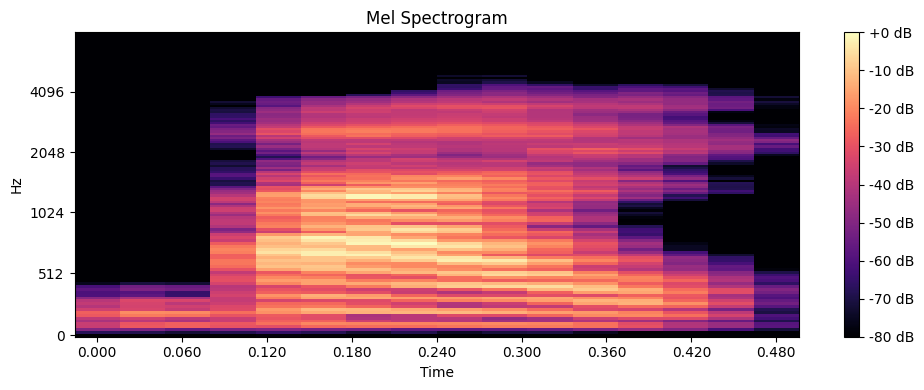

pad_audio


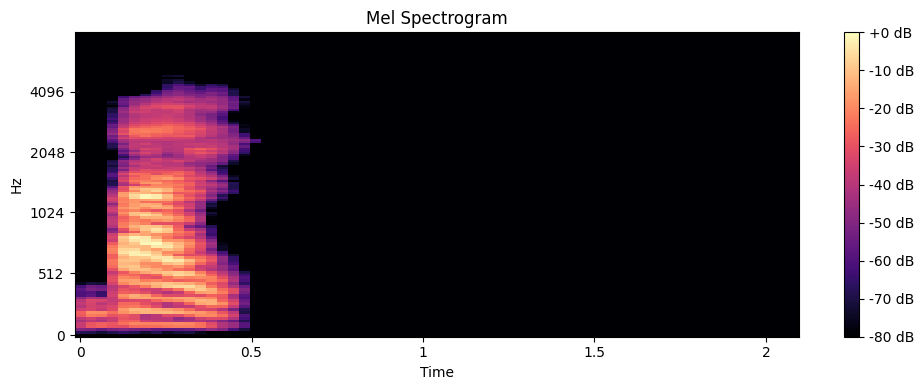

In [1317]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['pad_audio'])

In [1318]:
df['audio'] = df['pad_audio']
df = df.drop(columns=['pad_audio'])

### Augmentacja

1. Dodanie szumu - lepiej nie używać

In [1319]:
noise_level = 0.005

In [1320]:
def add_noise(audio):
    noise = noise_level * np.random.normal(0, 1, len(audio))
    return audio + noise

df['augmented_noise'] = df['audio'].apply(lambda x: (add_noise(x[0]), x[1]))

Playing ../../recordings/stageI/452/a100.wav with label 0


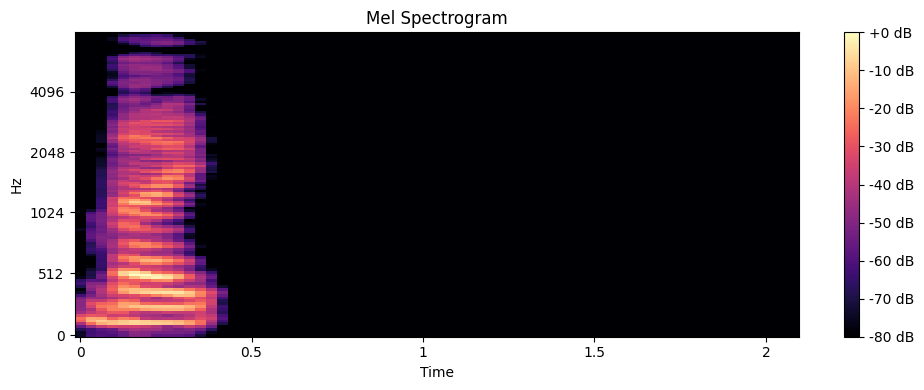

augmented_noise


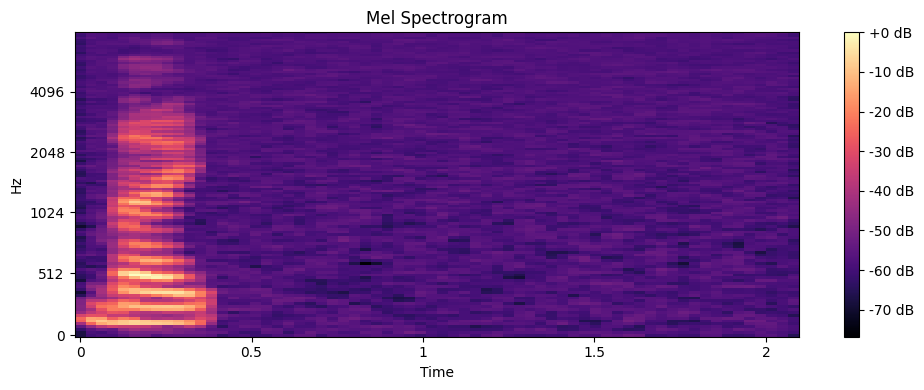

Playing ../../recordings/stageI/1323/a100.wav with label 0


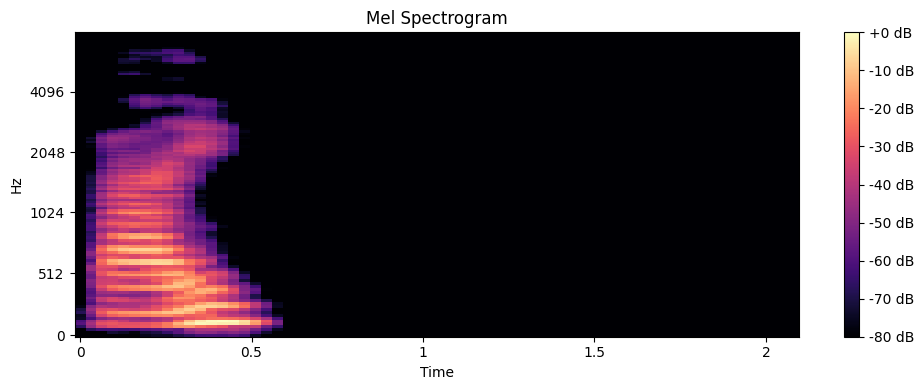

augmented_noise


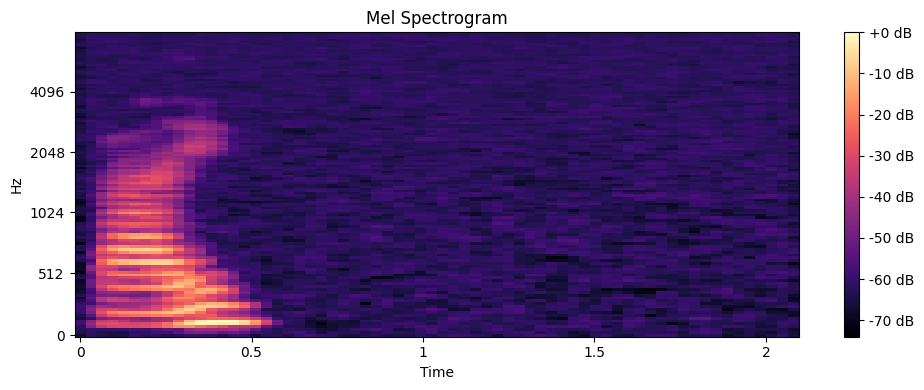

Playing ../../recordings/stageI/108/a100.wav with label 1


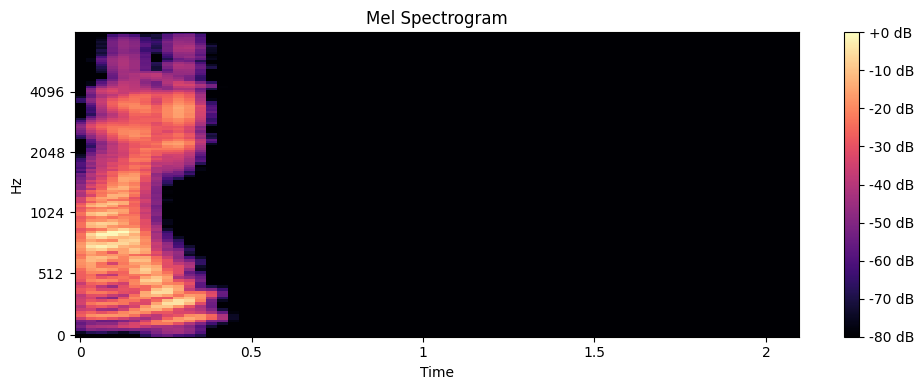

augmented_noise


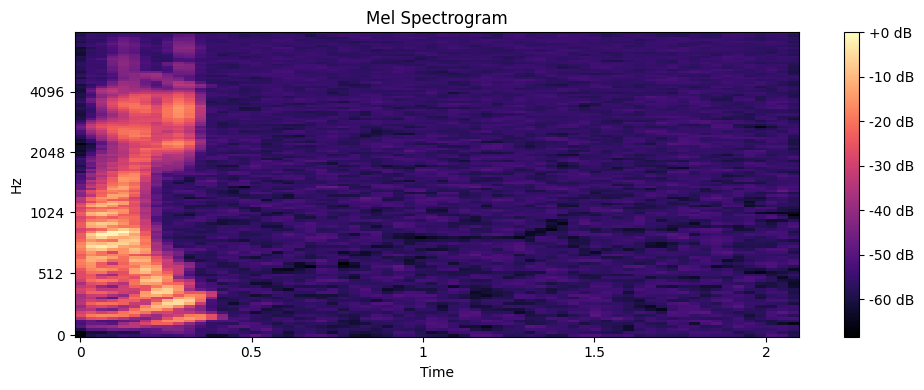

In [1321]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['augmented_noise'])

2. Zmiana szybkości

In [1322]:
def time_stretch(audio):
    rate = np.random.uniform(0.8, 1.2)
    return librosa.effects.time_stretch(audio,rate=rate)

df['augmented_speed'] = df['audio'].apply(lambda x: (time_stretch(x[0]), x[1]))
df['augmented_speed'] = df['augmented_speed'].apply(lambda x: (pad_to_max_length(x[0], max_length), x[1]))

Playing ../../recordings/stageI/1431/a100.wav with label 1


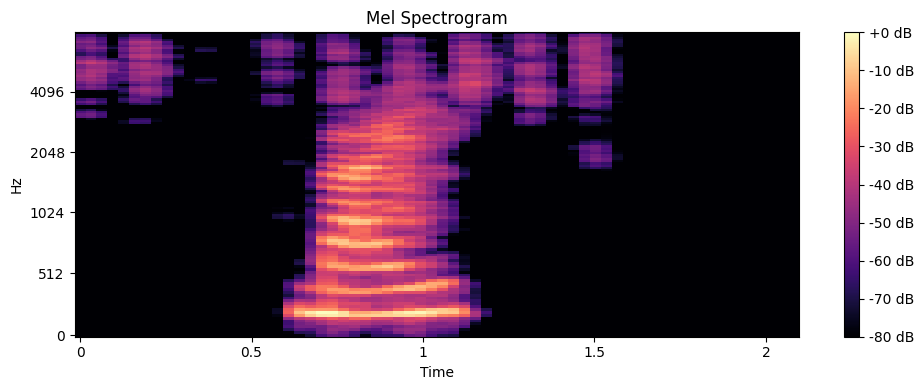

augmented_speed


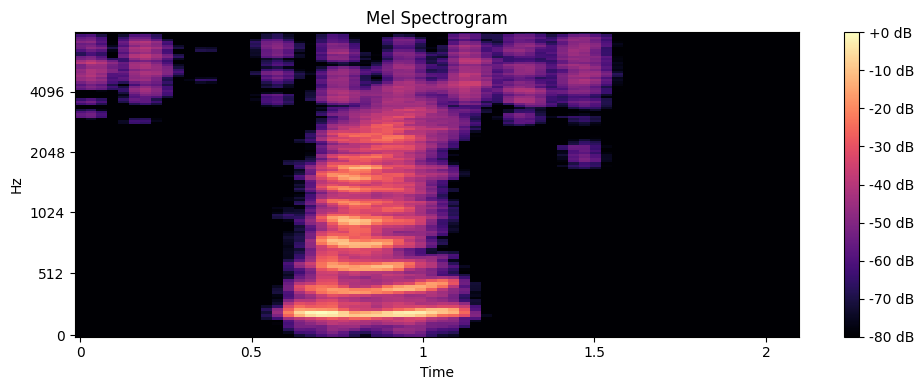

Playing ../../recordings/stageI/1392/a100.wav with label 0


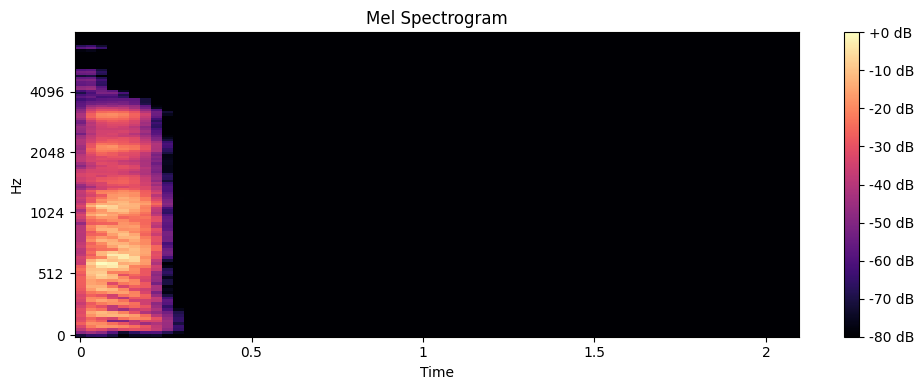

augmented_speed


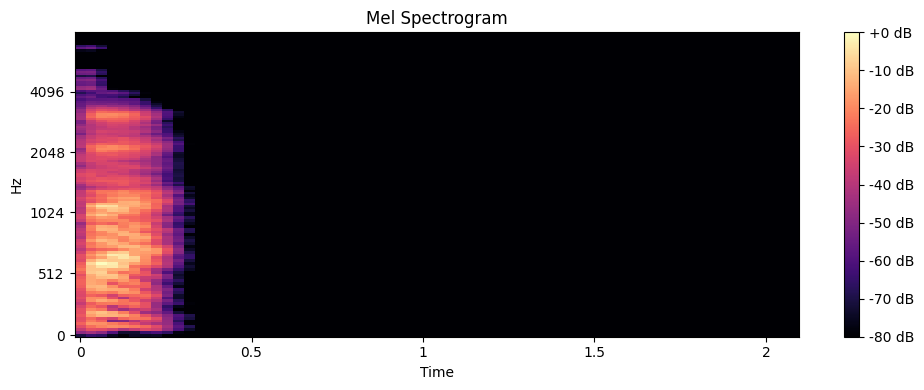

Playing ../../recordings/stageI/153/a100.wav with label 0


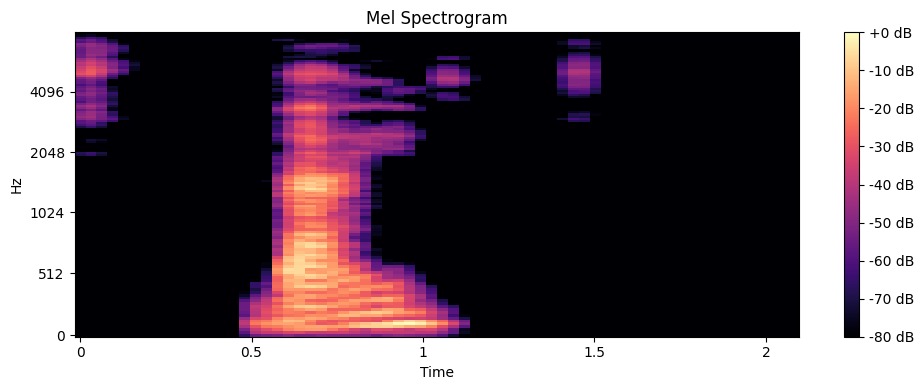

augmented_speed


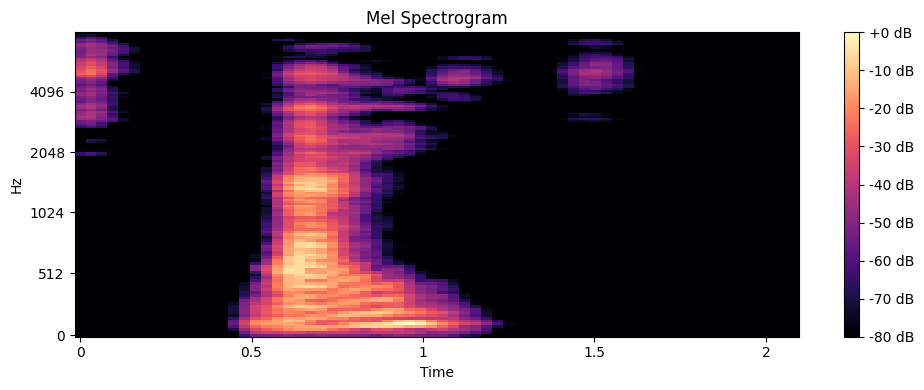

In [1323]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['augmented_speed'])

3. zmiana wysokości tonów

In [1324]:
def pitch_shift(audio, sr):
    n_steps = np.random.uniform(-2, 2)
    return librosa.effects.pitch_shift(audio, sr=sr, n_steps=n_steps)

df['augmented_tone'] = df['audio'].apply(lambda x: (pitch_shift(x[0], x[1]), x[1]))

Playing ../../recordings/stageI/773/a100.wav with label 1


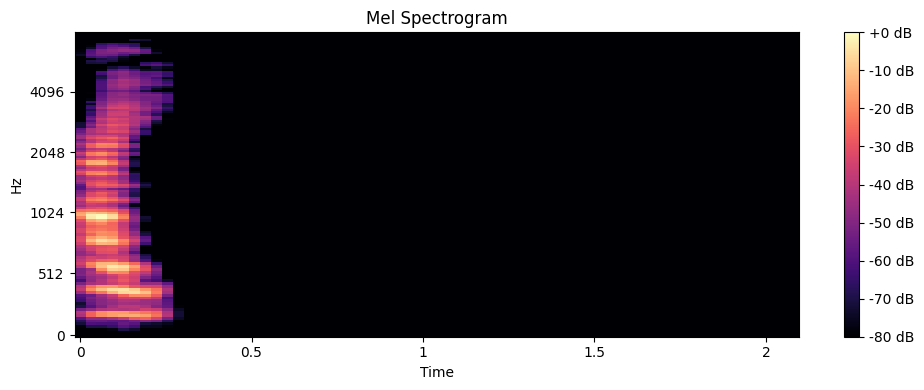

augmented_tone


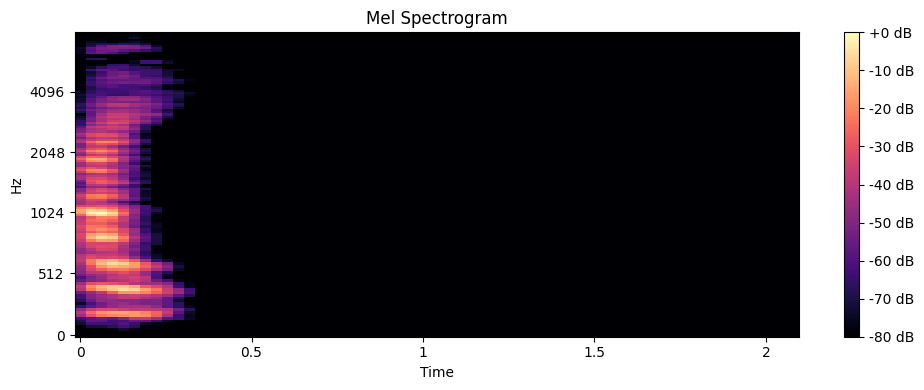

Playing ../../recordings/stageI/692/a100.wav with label 1


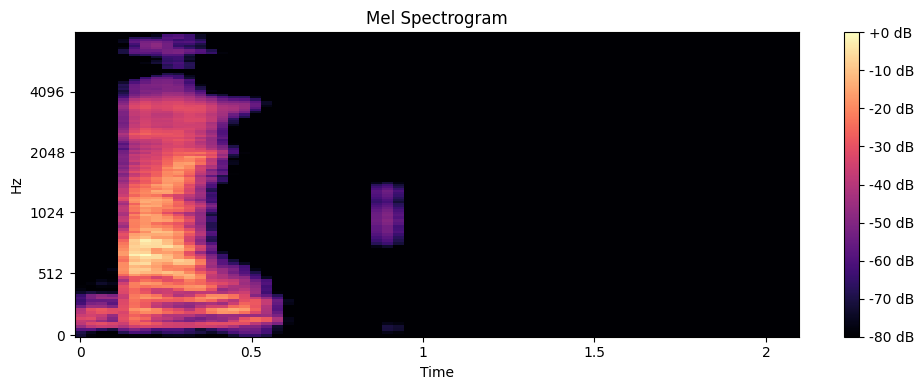

augmented_tone


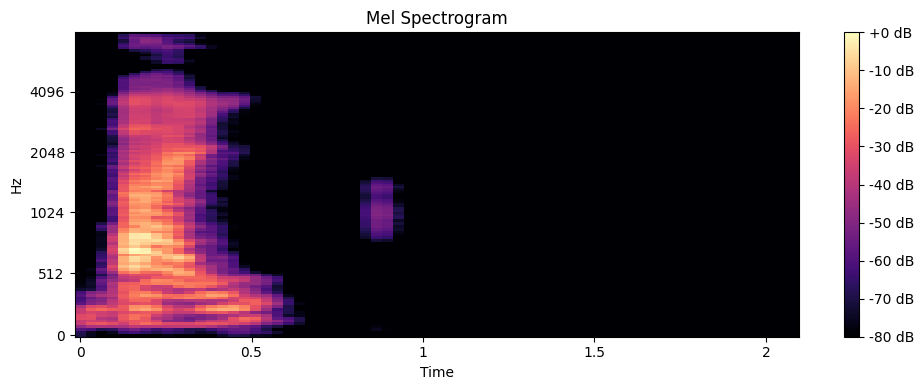

Playing ../../recordings/stageI/642/a100.wav with label 0


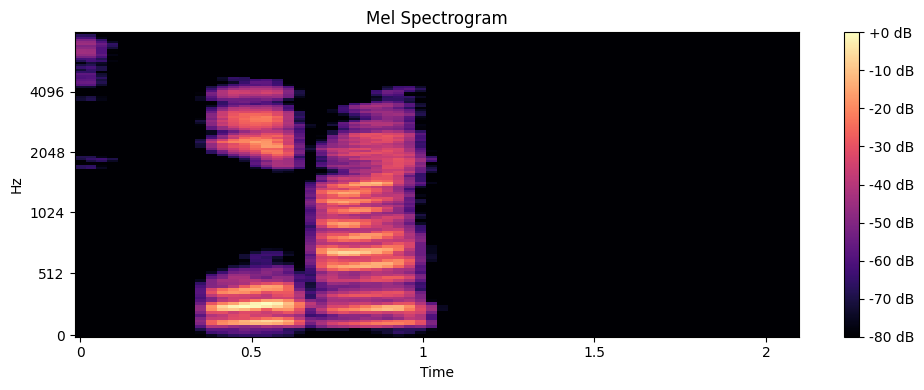

augmented_tone


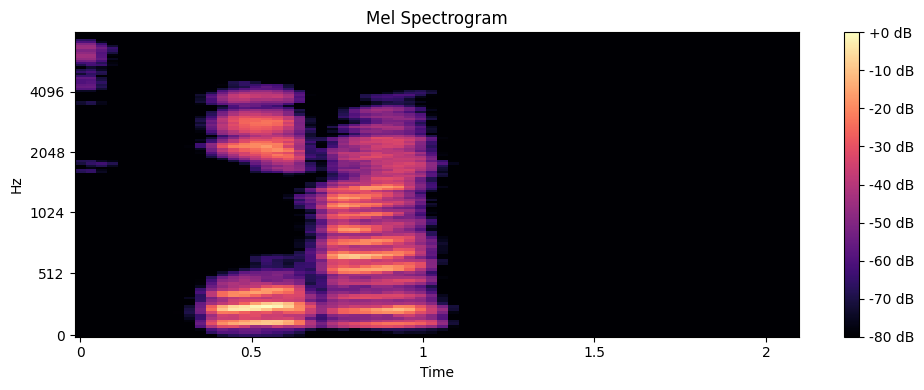

In [1325]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['augmented_tone'])

4. Zmiana głośności - chyba nic nie daje

In [1326]:
def change_volume(audio):
    factor = np.random.uniform(-1.5, 1.5)
    return audio * factor

df['augmented_volume'] = df['audio'].apply(lambda x: (change_volume(x[0]), x[1]))

Playing ../../recordings/stageI/762/a100.wav with label 1


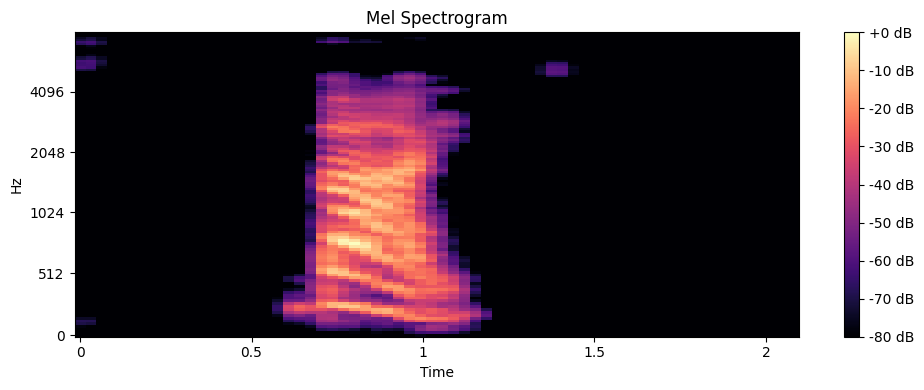

augmented_volume


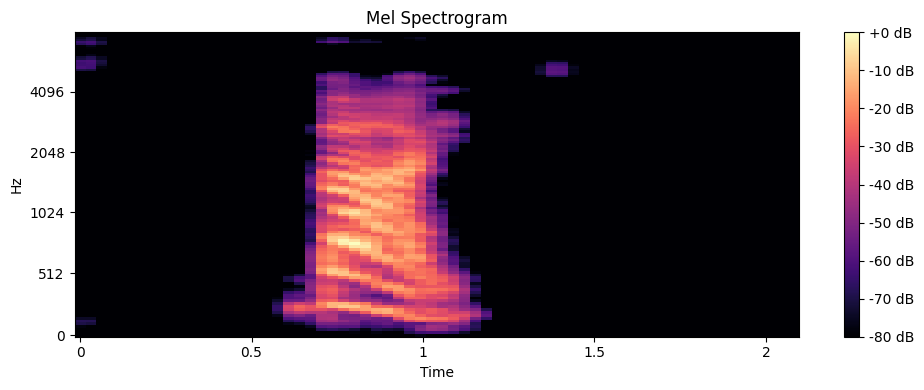

Playing ../../recordings/stageI/1072/a100.wav with label 1


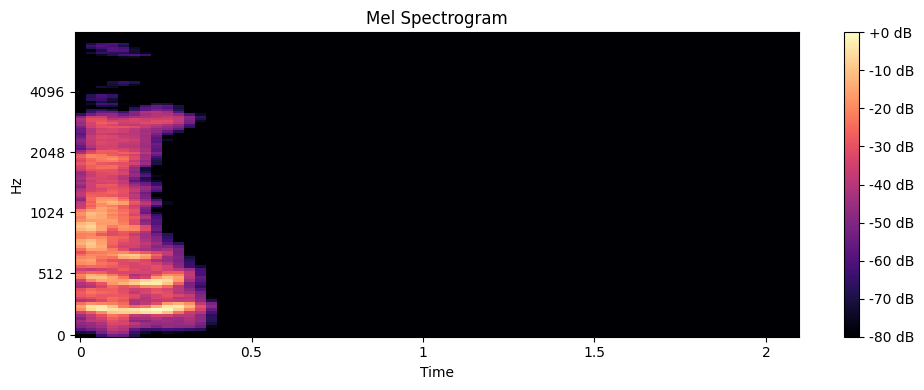

augmented_volume


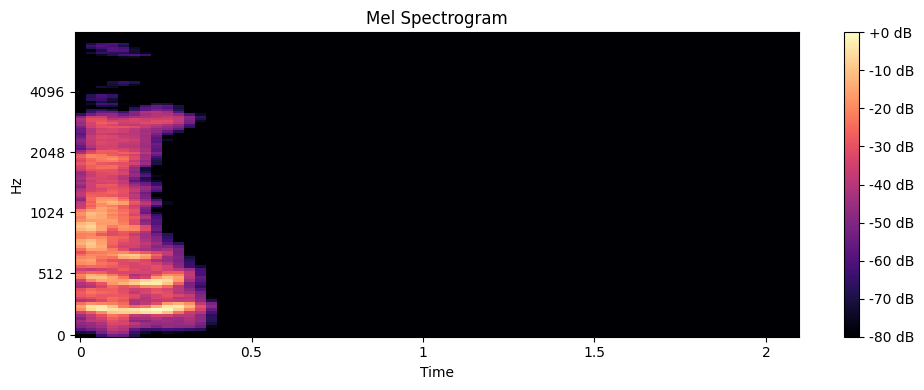

Playing ../../recordings/stageI/763/a100.wav with label 1


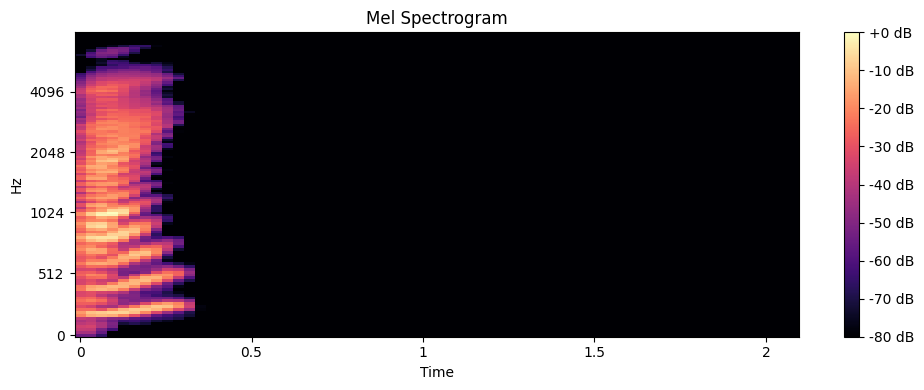

augmented_volume


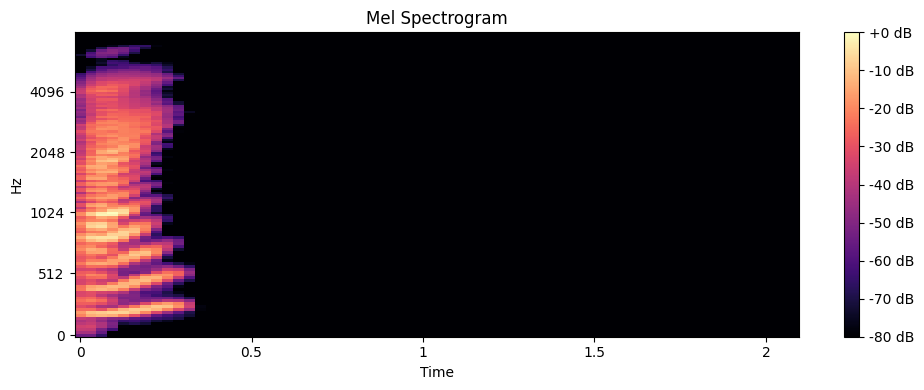

In [1327]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['augmented_volume'])

### Zbalansowanie klas

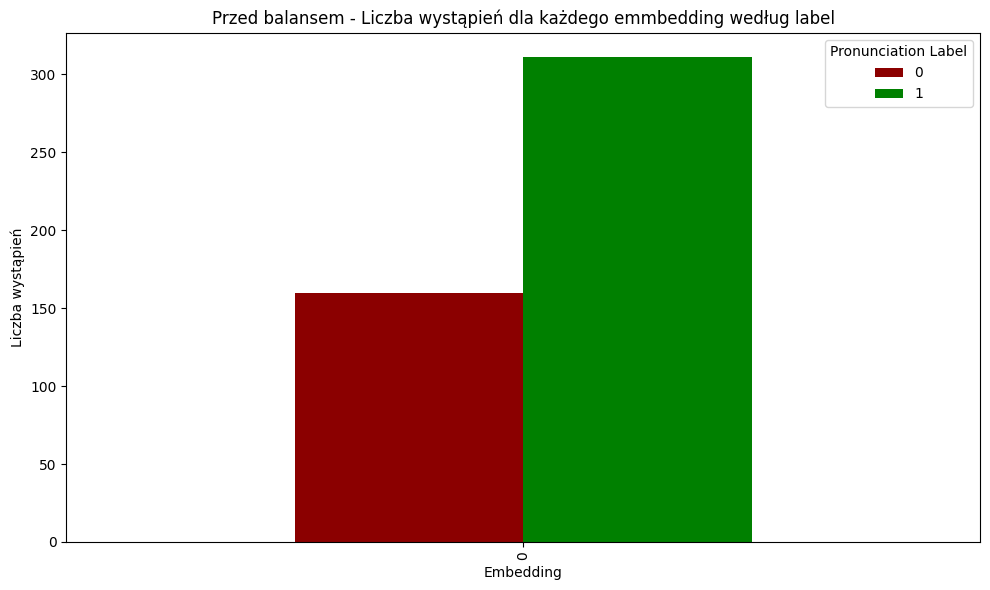

In [1328]:
grouped_data = df.groupby(['embedding', 'label']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', figsize=(10, 6), color=['darkred', 'green'])
plt.xlabel('Embedding')
plt.ylabel('Liczba wystąpień')
plt.title('Przed balansem - Liczba wystąpień dla każdego emmbedding według label')
plt.legend(title='Pronunciation Label', labels=['0', '1'])
plt.tight_layout()
plt.show()

In [1329]:
def balance_classes(data):
    balanced_data = []
    for word in data['embedding'].unique():
        subset = data[data['embedding'] == word]
        class_0 = subset[subset['label'] == 0]
        class_1 = subset[subset['label'] == 1]
        
        # Znajdź minimalną liczebność między klasami
        min_size = min(len(class_0), len(class_1))
        
        # Losowy wybór próbek do wyrównania
        class_0_balanced = class_0.sample(n=min_size, random_state=42)
        class_1_balanced = class_1.sample(n=min_size, random_state=42)
        
        # Dodaj zbalansowane dane do listy
        balanced_data.append(class_0_balanced)
        balanced_data.append(class_1_balanced)
    
    # Połącz wszystkie zbalansowane dane w jeden DataFrame
    return pd.concat(balanced_data).reset_index(drop=True)\

balanced_df = balance_classes(df)

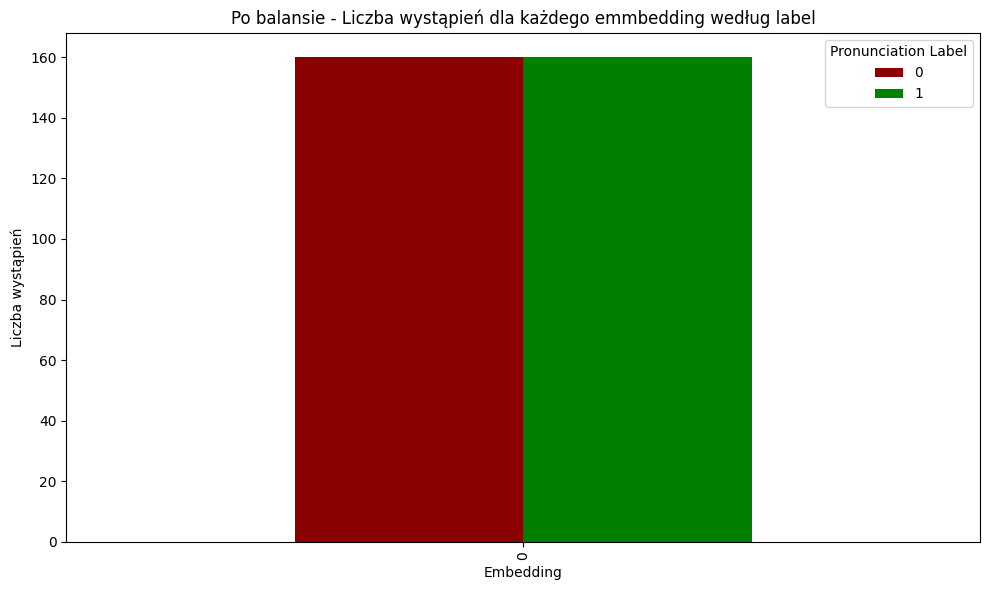

In [1330]:
grouped_data = balanced_df.groupby(['embedding', 'label']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', figsize=(10, 6), color=['darkred', 'green'])
plt.xlabel('Embedding')
plt.ylabel('Liczba wystąpień')
plt.title('Po balansie - Liczba wystąpień dla każdego emmbedding według label')
plt.legend(title='Pronunciation Label', labels=['0', '1'])
plt.tight_layout()
plt.show()


### Ekstrakcja MFCC

In [1331]:
def extract_mfcc(audio, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=n_mfcc)
    return mfcc.T
balanced_df['mfcc'] = balanced_df['audio'].apply(lambda x: extract_mfcc(x[0], x[1]))

### Obliczenie spektogramów

In [1332]:
balanced_df['mel_spectrogram'] = balanced_df['audio'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))

### Podział na zbiór treningowy, walidacyjny i testowy

In [1333]:
train_df, temp_df = train_test_split(balanced_df, test_size=0.3, random_state=42, stratify=balanced_df['label'])
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42, stratify=temp_df['label'])

In [1334]:
X_train = train_df['mfcc'].tolist()
word_indices_train = train_df['embedding'].tolist()
y_train = train_df['label'].tolist()

X_val = val_df['mfcc'].tolist()
word_indices_val = val_df['embedding'].tolist()
y_val = val_df['label'].tolist()

X_test = test_df['mfcc'].tolist()
word_indices_test = test_df['embedding'].tolist()
y_test = test_df['label'].tolist()

In [1335]:
X_train_spect = train_df['mel_spectrogram'].tolist()
word_indices_train_spect = train_df['embedding'].tolist()
y_train_spect = train_df['label'].tolist()

X_val_spect = val_df['mel_spectrogram'].tolist()
word_indices_val_spect = val_df['embedding'].tolist()
y_val_spect = val_df['label'].tolist()

X_test_spect = test_df['mel_spectrogram'].tolist()
word_indices_test_spect = test_df['embedding'].tolist()
y_test_spect = test_df['label'].tolist()

### Dodanie augmentacji do zbioru treningowego

In [1336]:

train_df['mfcc_speed'] = train_df['augmented_speed'].apply(lambda x: extract_mfcc(x[0], x[1]))
train_df['mfcc_tone'] = train_df['augmented_tone'].apply(lambda x: extract_mfcc(x[0], x[1]))

In [1337]:
X_augmented = train_df['mfcc_speed'].tolist() + train_df['mfcc_tone'].tolist()
word_indices_augmented = word_indices_train + word_indices_train
y_augmented = y_train + y_train

In [1338]:
train_df['mel_spectrogram_speed'] = train_df['augmented_speed'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))
train_df['mel_spectrogram_tone'] = train_df['augmented_tone'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))

In [1339]:
X_augmented_spect = train_df['mel_spectrogram_speed'].tolist() + train_df['mel_spectrogram_tone'].tolist()
word_indices_augmented_spect = word_indices_train_spect + word_indices_train_spect
y_augmented_spect = y_train_spect + y_train_spect

### Stworzenie zbioru dla MFCC

In [1340]:

def pad_or_trim_mfcc(mfcc, max_length):
    if mfcc.shape[0] < max_length:
        # Padding zerami
        padding = np.zeros((max_length - mfcc.shape[0], mfcc.shape[1]))
        return np.vstack([mfcc, padding])
    else:
        # Przycięcie
        return mfcc[:max_length, :] 
label_encoder = LabelEncoder()


max_length =max(
    max(mfcc.shape[0] for mfcc in X_train),
    max(mfcc.shape[0] for mfcc in X_val),
    max(mfcc.shape[0] for mfcc in X_test),
    max(mfcc.shape[0] for mfcc in X_augmented)
    ) 

X_train = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_train])
X_train = X_train[..., np.newaxis]
word_indices_train = np.array(word_indices_train)
y_train = np.array(y_train)
y_train = label_encoder.fit_transform(y_train)

X_val = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_val])
X_val = X_val[..., np.newaxis]
word_indices_val = np.array(word_indices_val)
y_val = np.array(y_val)
y_val = label_encoder.fit_transform(y_val)

X_test = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_test])
X_test = X_test[..., np.newaxis]
word_indices_test = np.array(word_indices_test)
y_test = np.array(y_test)
y_test = label_encoder.fit_transform(y_test)

X_augmented = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_augmented])
X_augmented = X_augmented[..., np.newaxis]
word_indices_augmented = np.array(word_indices_augmented)
y_augmented = np.array(y_augmented)
y_augmented = label_encoder.fit_transform(y_augmented)

In [1341]:
print(f"Rozmiar zbioru treningowego: {X_train.shape}")
print(f"Rozmiar zbioru walidacyjnego: {X_val.shape}")
print(f"Rozmiar zbioru testowego: {X_test.shape}")

Rozmiar zbioru treningowego: (224, 66, 13, 1)
Rozmiar zbioru walidacyjnego: (48, 66, 13, 1)
Rozmiar zbioru testowego: (48, 66, 13, 1)


In [1342]:
X_train_with_augmented = np.concatenate((X_train, X_augmented), axis=0)
word_indices_train_with_augmented = np.concatenate((word_indices_train, word_indices_augmented), axis=0)
y_train_with_augmented = np.concatenate((y_train, y_augmented), axis=0)
print(f"Rozmiar zbioru treningowego po dodaniu augemntacji: {X_train_with_augmented.shape}")


Rozmiar zbioru treningowego po dodaniu augemntacji: (672, 66, 13, 1)


### Stworzenie zbioru dla spectrogramów

3 kanałowe

In [1343]:

def normalize_data(X, max_value_norm):
    X = np.array(X)
    return X / max_value_norm

def prepare_spectrogram_images(mel_specs, cmap='viridis'):
    """
    Przetwarza tablicę spektrogramów NumPy (mel_spec_db) na obrazy w formacie NumPy.

    Parameters:
        mel_specs (np.ndarray): Tablica spektrogramów (kształt: [n_samples, height, width]).
        cmap (str): Kolor mapy do użycia (np. 'viridis', 'plasma').

    Returns:
        np.ndarray: Tablica spektrogramów w formacie obrazu (kształt: [n_samples, height, width, 3]).
    """
    # Pobierz mapę kolorów
    colormap = cm.get_cmap(cmap)

    # Normalizacja spektrogramów do zakresu [0, 1]
    mel_specs_normalized = (mel_specs - np.min(mel_specs, axis=(1, 2), keepdims=True)) / (
        np.max(mel_specs, axis=(1, 2), keepdims=True) - np.min(mel_specs, axis=(1, 2), keepdims=True) + 1e-6
    )

    # Zastosowanie mapy kolorów i konwersja do formatu RGB
    images = (colormap(mel_specs_normalized)[..., :3] * 255).astype(np.uint8)

    return images

max_value = max(np.max(np.abs(X_train_spect)), np.max(np.abs(X_val_spect)), np.max(np.abs(X_test_spect)), np.max(np.abs(X_augmented_spect)))


X_train_spect = np.array(X_train_spect)
X_train_spect = prepare_spectrogram_images(X_train_spect)
word_indices_train_spect = np.array(word_indices_train_spect)
y_train_spect = np.array(y_train_spect)
y_train_spect = label_encoder.fit_transform(y_train_spect)

X_val_spect = np.array(X_val_spect)
X_val_spect = prepare_spectrogram_images(X_val_spect)
word_indices_val_spect = np.array(word_indices_val_spect)
y_val_spect = np.array(y_val_spect)
y_val_spect = label_encoder.fit_transform(y_val_spect)

X_test_spect = np.array(X_test_spect)
X_test_spect = prepare_spectrogram_images(X_test_spect)
word_indices_test_spect = np.array(word_indices_test_spect)
y_test_spect = np.array(y_test_spect)
y_test_spect = label_encoder.fit_transform(y_test_spect)

X_augmented_spect = np.array(X_augmented_spect)
X_augmented_spect = prepare_spectrogram_images(X_augmented_spect)
word_indices_augmented_spect = np.array(word_indices_augmented_spect)
y_augmented_spect = np.array(y_augmented_spect)
y_augmented_spect = label_encoder.fit_transform(y_augmented_spect)

C:\Users\lukas\AppData\Local\Temp\ipykernel_1668\343902261.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap(cmap)
C:\Users\lukas\AppData\Local\Temp\ipykernel_1668\343902261.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap(cmap)
C:\Users\lukas\AppData\Local\Temp\ipykernel_1668\343902261.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap(cmap)
C:\Users\lukas\AppData\Local\Temp\ipykernel

1 kanałowe

In [1344]:
# X_train_spect = np.array(X_train_spect)[..., np.newaxis]
# word_indices_train_spect = np.array(word_indices_train_spect)
# y_train_spect = np.array(y_train_spect)
# y_train_spect = label_encoder.fit_transform(y_train_spect)

# X_val_spect = np.array(X_val_spect)[..., np.newaxis]
# word_indices_val_spect = np.array(word_indices_val_spect)
# y_val_spect = np.array(y_val_spect)
# y_val_spect = label_encoder.fit_transform(y_val_spect)

# X_test_spect = np.array(X_test_spect)[..., np.newaxis]
# word_indices_test_spect = np.array(word_indices_test_spect)
# y_test_spect = np.array(y_test_spect)
# y_test_spect = label_encoder.fit_transform(y_test_spect)

# X_augmented_spect = np.array(X_augmented_spect)[..., np.newaxis]
# word_indices_augmented_spect = np.array(word_indices_augmented_spect)
# y_augmented_spect = np.array(y_augmented_spect)
# y_augmented_spect = label_encoder.fit_transform(y_augmented_spect)

In [1345]:
print(f"Rozmiar zbioru treningowego: {X_train_spect.shape}")
print(f"Rozmiar zbioru walidacyjnego: {X_val_spect.shape}")
print(f"Rozmiar zbioru testowego: {X_test_spect.shape}")

Rozmiar zbioru treningowego: (224, 128, 66, 3)
Rozmiar zbioru walidacyjnego: (48, 128, 66, 3)
Rozmiar zbioru testowego: (48, 128, 66, 3)


In [1346]:
X_train_with_augmented_spect = np.concatenate((X_train_spect, X_augmented_spect), axis=0)
word_indices_train_with_augmented_spect = np.concatenate((word_indices_train_spect, word_indices_augmented_spect), axis=0)
y_train_with_augmented_spect = np.concatenate((y_train_spect, y_augmented_spect), axis=0)
print(f"Rozmiar zbioru treningowego po dodaniu augemntacji: {X_train_with_augmented_spect.shape}")

Rozmiar zbioru treningowego po dodaniu augemntacji: (672, 128, 66, 3)


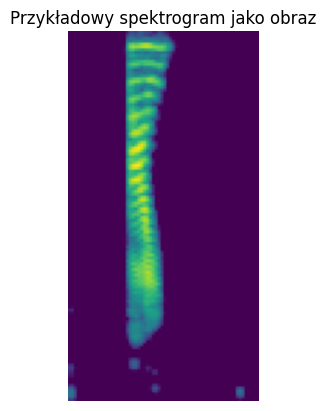

In [1347]:
plt.imshow(X_train_with_augmented_spect[2])
plt.axis('off') 
plt.title("Przykładowy spektrogram jako obraz")
plt.show()

### Wizualizacji rozkładu word_indices dla każdej klasy

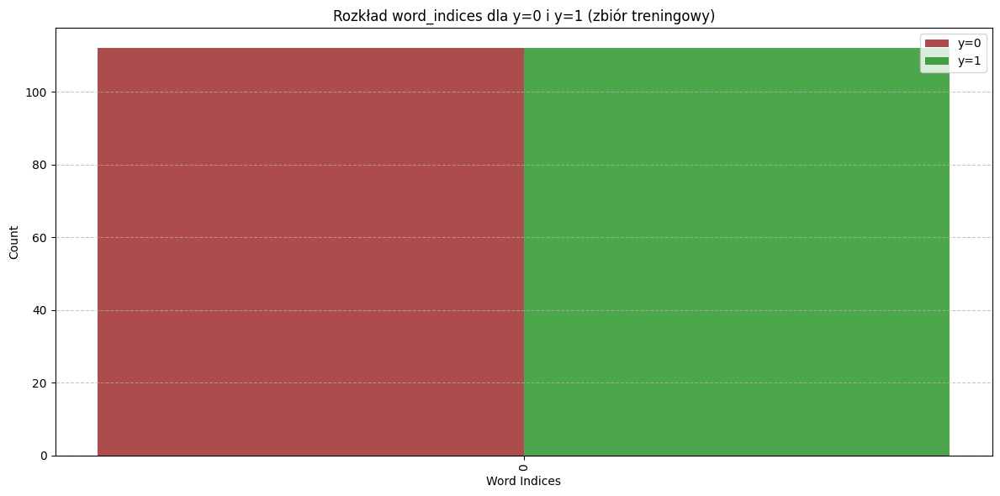

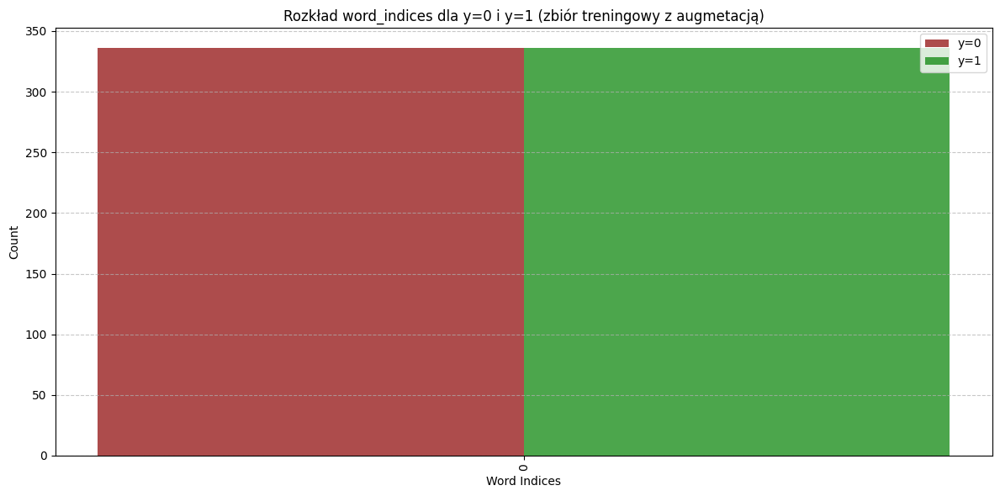

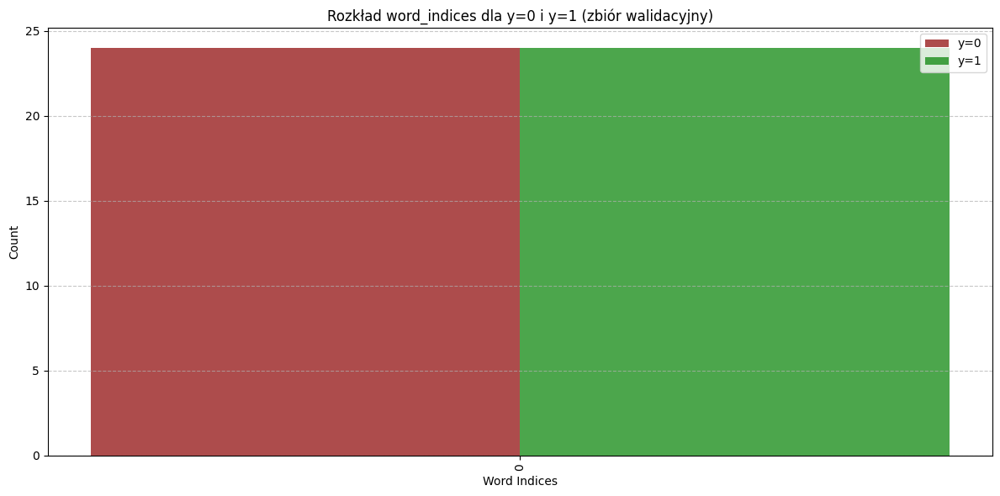

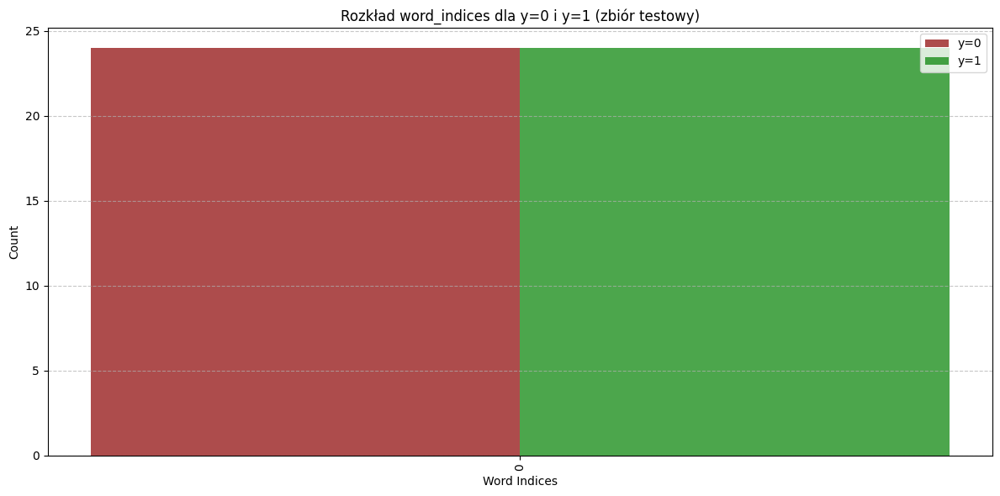

In [1348]:
def plot_word_indices_grouped(word_indices, y, title):
    unique_word_indices = np.unique(word_indices)
    unique_labels = np.unique(y)
    word_label_counts = {word: {label: 0 for label in unique_labels} for word in unique_word_indices}
    for word, label in zip(word_indices, y):
        word_label_counts[word][label] += 1
    bar_width = 0.35
    index = np.arange(len(unique_word_indices))
    counts_class_0 = [word_label_counts[word][0] for word in unique_word_indices]
    counts_class_1 = [word_label_counts[word][1] for word in unique_word_indices]
    plt.figure(figsize=(12, 6))
    plt.bar(index - bar_width / 2, counts_class_0, bar_width, label='y=0', color='darkred', alpha=0.7)
    plt.bar(index + bar_width / 2, counts_class_1, bar_width, label='y=1', color='green', alpha=0.7)
    plt.xlabel('Word Indices')
    plt.ylabel('Count')
    plt.title(title)
    plt.xticks(index, unique_word_indices, rotation=90)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

plot_word_indices_grouped(word_indices_train, y_train, "Rozkład word_indices dla y=0 i y=1 (zbiór treningowy)")
plot_word_indices_grouped(word_indices_train_with_augmented, y_train_with_augmented, "Rozkład word_indices dla y=0 i y=1 (zbiór treningowy z augmetacją)")
plot_word_indices_grouped(word_indices_val, y_val, "Rozkład word_indices dla y=0 i y=1 (zbiór walidacyjny)")
plot_word_indices_grouped(word_indices_test, y_test, "Rozkład word_indices dla y=0 i y=1 (zbiór testowy)")


### Save data

In [1349]:
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
subsets = ["train", "val", "test"]

In [1350]:
save_dir = os.path.join(data_dir, timestamp, "mfcc")
for subset in subsets:
    os.makedirs(os.path.join(save_dir, subset), exist_ok=True)
save_data({"X_train": X_train, "y_train": y_train, "word_train": word_indices_train}, save_dir, "train")
save_data({"X_val": X_val, "y_val": y_val, "word_val": word_indices_val}, save_dir, "val")
save_data({"X_test": X_test, "y_test": y_test, "word_test": word_indices_test}, save_dir, "test")
print(f"zapisano w {save_dir}")

zapisano w data\20241214_205334\mfcc


In [1351]:
save_dir = os.path.join(data_dir, timestamp, "mfcc_augmented")
for subset in subsets:
    os.makedirs(os.path.join(save_dir, subset), exist_ok=True)
save_data({"X_train": X_train_with_augmented, "y_train": y_train_with_augmented, "word_train": word_indices_train_with_augmented}, save_dir, "train")
save_data({"X_val": X_val, "y_val": y_val, "word_val": word_indices_val}, save_dir, "val")
save_data({"X_test": X_test, "y_test": y_test, "word_test": word_indices_test}, save_dir, "test")
print(f"zapisano w {save_dir}")

zapisano w data\20241214_205334\mfcc_augmented


In [1352]:
save_dir = os.path.join(data_dir, timestamp, "spectrogram")
for subset in subsets:
    os.makedirs(os.path.join(save_dir, subset), exist_ok=True)
save_data({"X_train": X_train_spect, "y_train": y_train_spect, "word_train": word_indices_train_spect}, save_dir, "train")
save_data({"X_val": X_val_spect, "y_val": y_val_spect, "word_val": word_indices_val_spect}, save_dir, "val")
save_data({"X_test": X_test_spect, "y_test": y_test_spect, "word_test": word_indices_test_spect}, save_dir, "test")
print(f"zapisano w {save_dir}")

zapisano w data\20241214_205334\spectrogram


In [1353]:
save_dir = os.path.join(data_dir, timestamp, "spectrogram_augmented")
for subset in subsets:
    os.makedirs(os.path.join(save_dir, subset), exist_ok=True)
save_data({"X_train": X_train_with_augmented_spect, "y_train": y_train_with_augmented_spect, "word_train": word_indices_train_with_augmented_spect}, save_dir, "train")
save_data({"X_val": X_val_spect, "y_val": y_val_spect, "word_val": word_indices_val_spect}, save_dir, "val")
save_data({"X_test": X_test_spect, "y_test": y_test_spect, "word_test": word_indices_test_spect}, save_dir, "test")
print(f"zapisano w {save_dir}")

zapisano w data\20241214_205334\spectrogram_augmented
